# Assignment 3-4
by Dmytro Miedviediev 2024-01-15

**Note**

Plotly plots are interactive if using `.html` format!

In [770]:
import datetime
import time
import warnings
from collections import OrderedDict
from itertools import cycle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import seaborn as sns
import statsmodels.api as sm
import statsmodels.stats.outliers_influence as oi
from plotly.subplots import make_subplots
from scipy import stats
from scipy.stats import kstest, norm
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer
from sklearn.linear_model import LassoCV, LinearRegression, Ridge, RidgeCV, lasso_path
from sklearn.metrics import (
    accuracy_score,
    auc,
    confusion_matrix,
    mean_squared_error,
    precision_score,
    recall_score,
    roc_curve,
)
from sklearn.model_selection import KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree
from sklearn.utils import resample
from tqdm import tqdm

plotly.offline.init_notebook_mode()
pd.set_option("display.max_rows", 100)


warnings.simplefilter(action="ignore")

In [24]:
dummies = [
    "MSSubClass",
    "MSZoning",
    "Street",
    "Alley",
    "LotShape",
    "LandContour",
    "Neighborhood",
    "Condition1",
    "Condition2",
    "BldgType",
    "HouseStyle",
    "RoofStyle",
    "RoofMatl",
    "Exterior1st",
    "Exterior2nd",
    "MasVnrType",
    "Foundation",
    "Heating",
    "CentralAir",
    "Electrical",
    "Functional",
    "GarageType",
    "MiscFeature",
    "SaleType",
    "SaleCondition",
]
ordinal = [
    "Utilities",
    "LotConfig",
    "LandSlope",
    "ExterQual",
    "ExterCond",
    "BsmtQual",
    "BsmtCond",
    "BsmtExposure",
    "BsmtFinType1",
    "BsmtFinType2",
    "HeatingQC",
    "KitchenQual",
    "FireplaceQu",
    "GarageFinish",
    "GarageQual",
    "GarageCond",
    "PavedDrive",
    "PoolQC",
    "Fence",
]
ordinal_numerical = [
    "OverallQual",
    "OverallCond",
    "BsmtFullBath",
    "BsmtHalfBath",
    "FullBath",
    "HalfBath",
    "TotRmsAbvGrd",
    "Fireplaces",
    "GarageCars",
    "MiscVal",
    "BedroomAbvGr",
    "KitchenAbvGr",
]
numerical = [
    "LotFrontage",
    "YearBuilt",
    "YearRemodAdd",
    "MasVnrArea",
    "BsmtFinSF1",
    "BsmtFinSF2",
    "BsmtUnfSF",
    "TotalBsmtSF",
    "1stFlrSF",
    "2ndFlrSF",
    "LowQualFinSF",
    "GrLivArea",
    "GarageYrBlt",
    "GarageArea",
    "WoodDeckSF",
    "OpenPorchSF",
    "EnclosedPorch",
    "3SsnPorch",
    "ScreenPorch",
    "PoolArea",
    "MoSold",
    "YrSold",
    "LotArea",
]

In [25]:
df_train = pd.read_csv("data/train.csv")
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [26]:
df_test = pd.read_csv("data/test.csv")
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


## Problem 5

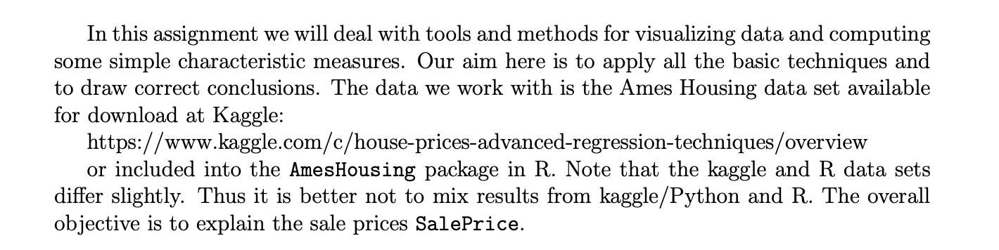

### Task 1

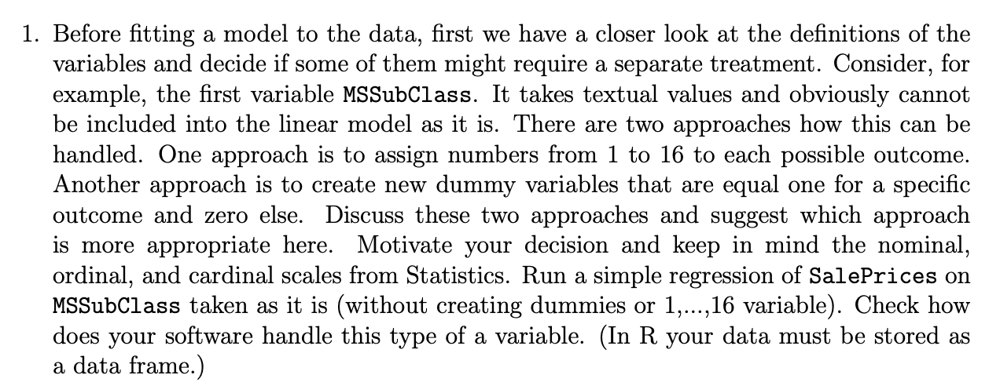

**Discuss two approaches of working with textual data**

So, to work with this feature we have two options: to encode it with numbers (LabelEncoding) or make dummy variables (OneHotEncoding).
LabelEncoding is usefull when categorical data is ordered. For example, bad, normal, good. We have a clear order and it is usefull to encode it.
On the other hand, OneHotEncoding is applied when the categorical data is truly nominal, without any order.

**Motivate decision using nominal, ordinal, and cardinal scales**

According to the data description: "MSSubClass: Identifies the type of dwelling involved in the sale."
If we look at the description of each code, we clearly can see that this variable is a nominal scale, as there is no order or any other numeric interpretation of each code.
It is just category, so it will be better to apply OneHotEncoding to introduce dummy variables.

In [27]:
# run simple regression X = MSSubClass vs Y = SalePrices
X_train_ms = sm.add_constant(df_train[["MSSubClass"]])
model_ms = sm.OLS(df_train["SalePrice"], X_train_ms).fit()
print(model_ms.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     10.43
Date:                Thu, 18 Jan 2024   Prob (F-statistic):            0.00127
Time:                        09:59:45   Log-Likelihood:                -18539.
No. Observations:                1460   AIC:                         3.708e+04
Df Residuals:                    1458   BIC:                         3.709e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.899e+05   3474.287     54.667      0.0

In [28]:
df_train["MSSubClass"].dtype

dtype('int64')

**What does model do with the feature values?**

Our categorical feature is represented as a numerical codes, so our software treat it as a regular numerical feature. This is not desired behaviour.

### Task 2

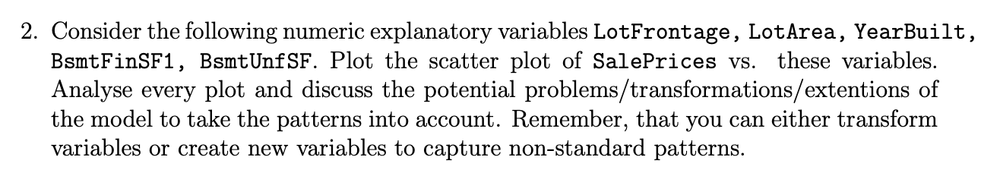

In [29]:
# take LotFrontage, LotArea, YearBuilt, BsmtFinSF1, BsmtUnfSF
numerical_features = [
    "LotFrontage",
    "LotArea",
    "YearBuilt",
    "BsmtFinSF1",
    "BsmtUnfSF",
]
target_features = ["SalePrice"]
df_train_numerical = df_train[numerical_features + target_features]

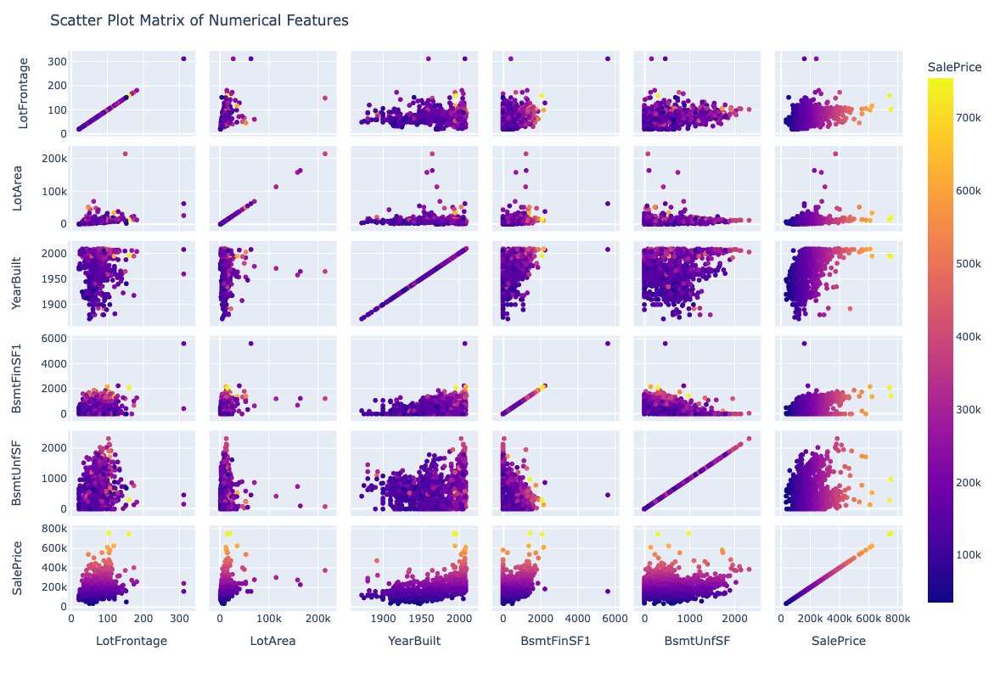

In [30]:
# plot scatter plot of SalePrices
fig = px.scatter_matrix(
    df_train,
    dimensions=[
        *numerical_features,
        *target_features,
    ],
    color="SalePrice",
    height=700,
)

fig.update_layout(
    title="Scatter Plot Matrix of Numerical Features",
    dragmode="select",
    width=1000,
    height=800,
)

fig.show()

**Analyse every plot and discuss the:a) problems, b) transformations, c) extenstions of the model to take patterns**

1. LotFrontage

a) We see outliers, huge SalePrice-s and LotFrontage-s as well. There are no linear dependency and it is hardly clear non-linear. So, the dependency in any case is weak.

b) We can try to apply square root or log transformations to model this variable.

c) -

2. LotArea

a) We see outliers here for both variables as well. The dependency is stronger than with the previous variable and it is clearly non-linear.

b) Here we also can try the root or log transformations.

c) According to the description and plot, LotFrontage and LotArea are connected, so maybe we can combine them into one feature or remove LotFrontage as part of LotArea.

3. YearBuilt

a) Traditionally, outliers for SalePrice-s, but years looks not to have them. The dependency shows positive trend to having bigger prices with year increase. Still, there is a big interval between prices each year, but this feature can help to adjust general price trend.

b) Here we can try to apply square to the variable.

c) -

4. BsmtFinSF1

a) We see outliers here for both variables as well. The dependency shows positive trend to having bigger prices with bigger area.

b) Here we can try to apply the square to the variable.

c) -

5. BsmtUnfSF

a) We see outliers here for both variables as well. The dependency shows positive trend to having bigger prices with bigger area.

b) Here we can try to apply the square to the variable.

c) We can make sum of BsmtFinSF1 and BsmtUnfSF to calculate total basement area. 


Except outliers, I would say that the scale is a problem. It would be easier for us and linear regression to work with scaled data.

In [31]:
# make transformations to capture the patterns
df_train_numerical_transformed = df_train[numerical_features + target_features].copy()

df_train_numerical_transformed["log_LotFrontage"] = np.log(
    df_train_numerical_transformed["LotFrontage"]
)
df_train_numerical_transformed["log_LotArea"] = np.log(
    df_train_numerical_transformed["LotArea"]
)
df_train_numerical_transformed["log_LotWidth"] = np.log(
    df_train_numerical_transformed["LotArea"]
    / df_train_numerical_transformed["LotFrontage"]
)
df_train_numerical_transformed["YearBuilt^2"] = (
    df_train_numerical_transformed["YearBuilt"] ** 2
)
df_train_numerical_transformed["BsmtFinSF1^2"] = (
    df_train_numerical_transformed["BsmtFinSF1"] ** 2
)
df_train_numerical_transformed["BsmtUnfSF^2"] = (
    df_train_numerical_transformed["BsmtUnfSF"] ** 2
)
df_train_numerical_transformed["(BsmtFinSF1+BsmtUnfSF^2)"] = (
    df_train_numerical_transformed["BsmtFinSF1"]
    + df_train_numerical_transformed["BsmtUnfSF"]
) ** 2

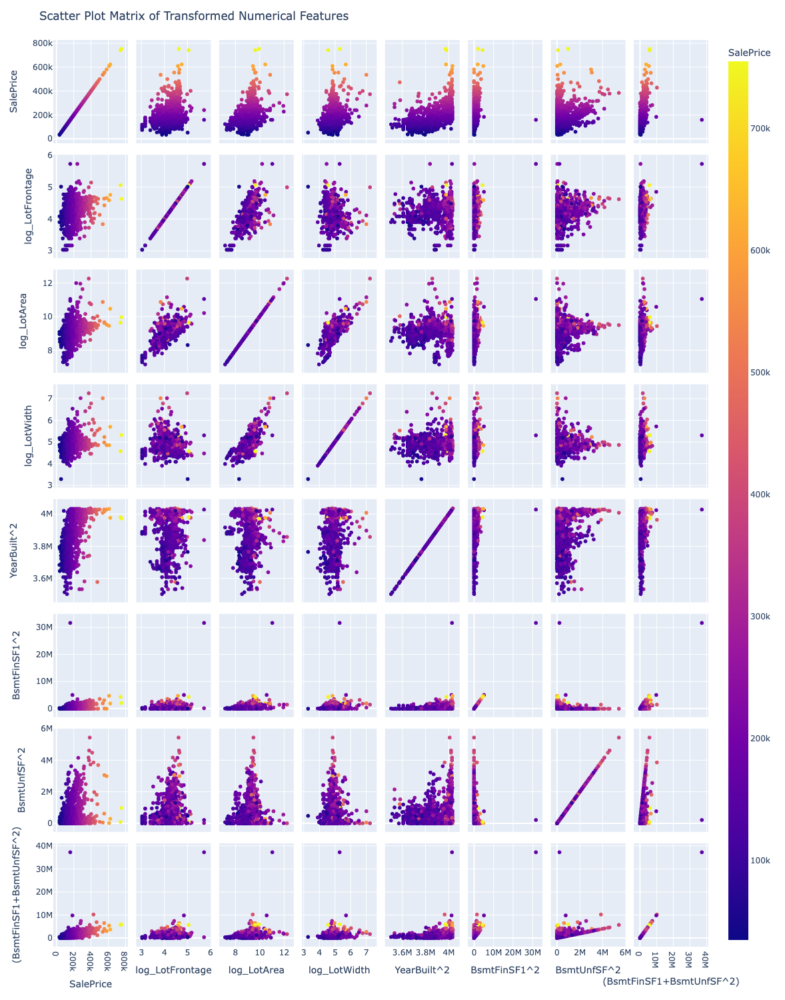

In [32]:
# plot scatter plots for transformed features
fig = px.scatter_matrix(
    df_train_numerical_transformed,
    dimensions=[
        "SalePrice",
        "log_LotFrontage",
        "log_LotArea",
        "log_LotWidth",
        "YearBuilt^2",
        "BsmtFinSF1^2",
        "BsmtUnfSF^2",
        "(BsmtFinSF1+BsmtUnfSF^2)",
    ],
    color="SalePrice",
    height=1200,
)

fig.update_layout(
    title="Scatter Plot Matrix of Transformed Numerical Features",
    dragmode="select",
    width=1200,
    height=1500,
)

fig.show()

### Task 3

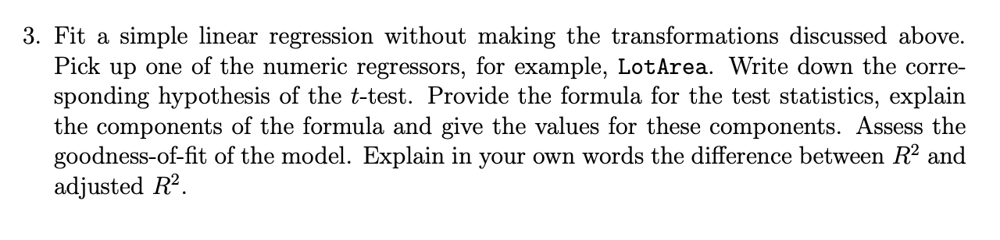

In [33]:
# make linear regression on the previous numeric features
X_train_ms = sm.add_constant(df_train[numerical_features].fillna(0))
model_ms = sm.OLS(df_train["SalePrice"], X_train_ms).fit()
print(model_ms.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.491
Method:                 Least Squares   F-statistic:                     282.4
Date:                Thu, 18 Jan 2024   Prob (F-statistic):          2.88e-211
Time:                        10:00:01   Log-Likelihood:                -18049.
No. Observations:                1460   AIC:                         3.611e+04
Df Residuals:                    1454   BIC:                         3.614e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const       -1.748e+06   1.05e+05    -16.631      

**LotArea**

**a) Hypothesis**

Null Hypothesis (H0): The coefficient is equal to zero (no effect).

Alternative Hypothesis (H1): The coefficient is not equal to zero (there is an effect).

**b) Formula and its components**

$t = \frac{\hat{\beta_j} - \beta_j^*}{\sqrt{Var(\hat{\beta_j})}}$

$\hat{\beta_j} = 1.2490$ - estimated coefficient from regression

$\beta_j^*=0$ - value of coefficient under the H0 (The coefficient is equal to zero (no effect))

$Var(\hat{\beta_j}) = 0.154^2$ - standard error of the coefficient

$t = \frac{1.2490 - 0}{0.154} = 8.110$

**c) Goodness-of-fit**

R-squared: 0.493

Adj. R-squared: 0.491

**d) R^2 and adj_R^2**

The difference between these two measures is pretty simple. R^2 is calculated as the ratio between explained sum of squares and total sum of squares. With increasing number of features, explained sum of squares will increase in any case, but the total sum will remain the same. So, R^2 will increase as well. To fix this, we need to consider number of features in the measure. This is what adj_R^2 do.

### Task 4

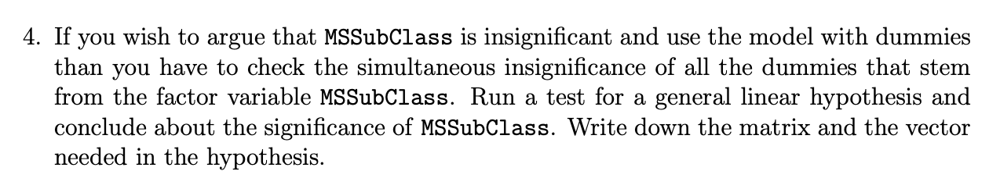

In [34]:
df_train["MSSubClass"].value_counts()

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64

In [35]:
# make general linear hypothesis test
df_train_dummies = pd.get_dummies(
    df_train["MSSubClass"], prefix="MSSubClass", drop_first=True
)
df_train_with_dummies = pd.concat([df_train, df_train_dummies], axis=1).fillna(0)
X = df_train_with_dummies[
    list(df_train_dummies.columns)
    + ["LotFrontage", "LotArea", "YearBuilt", "BsmtFinSF1", "BsmtUnfSF", "BedroomAbvGr"]
]
X = sm.add_constant(X)
y = df_train["SalePrice"]
model_with_dummies = sm.OLS(y, X).fit()

hypothesis_test = ", ".join(
    [f"({column} = 0)" for column in list(df_train_dummies.columns)]
)
test_result = model_with_dummies.wald_test(hypothesis_test, scalar=True)
print(test_result)

<F test: F=22.62461486267208, p=4.857584295319058e-53, df_denom=1.44e+03, df_num=14>


**Conclusion**
The p-value is very close to zero, suggesting that there is a significant effect on the dependent variable of dummy variables.

The number of dummie variables we tested equal to 14. We dropped the first dummy variable to avoid problems with collinearity as each sale has MSSubClass type.

The vector r should be zero and has the 1x14 (number of dummy variables), as we test all dummy variables to be zeros and do not have a significant effect on the dependent variable.

$r = [0, 0, ..., 0]$

The R matrix has the 14xn, where 14 - is the number of dummy variables and n - is the total number of features with dummy ones.

We will have the following matrix

\begin{bmatrix}
    0       & 1 & 0 & \dots & 0 & \dots & 0 \\
    0       & 0 & 1 & \dots & 0 & \dots & 0 \\
    \dots \\
    0       & 0 & 0 & \dots & 1 & \dots & 0
\end{bmatrix}

First column is zero vector ($\beta_0$), then identity matrix 14x14 and rest of the matrix are just zeros.

### Task 5

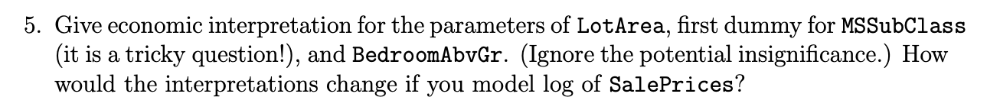

In [36]:
print(model_with_dummies.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.598
Method:                 Least Squares   F-statistic:                     109.5
Date:                Thu, 18 Jan 2024   Prob (F-statistic):          1.78e-271
Time:                        10:00:39   Log-Likelihood:                -17869.
No. Observations:                1460   AIC:                         3.578e+04
Df Residuals:                    1439   BIC:                         3.589e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           -2.06e+06   1.66e+05    -12.

In [37]:
df_train["BedroomAbvGr"].value_counts()

3    804
2    358
4    213
1     50
5     21
6      7
0      6
8      1
Name: BedroomAbvGr, dtype: int64

**a) LotArea**

On an average, with increase of LotArea on 1 unit, SalePrice increases on $\beta = 0.9396$ units. Larger lots (more area) may be associated with higher house prices, as buyers might be willing to pay more for more spacious properties.

**b) MSSubClass_30**

The coefficient shows the average increase $\beta = 9447.9797$ in SalePrice when the dummy is equal to 1 comparing to the case when the dummy is equal to base MSSubClass_20. This represents how valuable this type of dwelling and its effect on sale comparing to the base option.


**c) BedroomAbvGr**

The coefficient reflects the average change in SalePrice associated with moving up one level in the grade of bedrooms. For a one-unit increase in the grade, the predicted SalePrice changes by the $\beta = 5177.8008$.

**c) log(SalePrices)**

Generally, after applying log transformation we move to the percentage units. For numerical features the coefficient shows increase in the target variable change by $\beta$% when variable increases by 1 unit. For dummy variables, the coefficient shows increase in target variable by $e^{\beta} - 1$ when variable equals to 1.


### Task 6

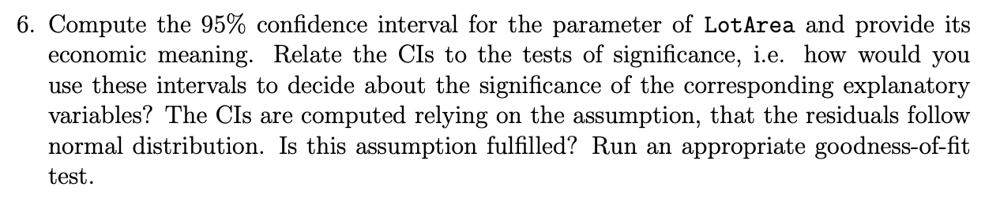

In [38]:
coefficient_LotArea = 0.9396
SE_LotArea = 0.141
df_denom = 20

alpha = 0.05
t_critical = stats.t.ppf(1 - alpha / 2, df_denom)

margin_of_error = t_critical * SE_LotArea

lower_bound = coefficient_LotArea - margin_of_error
upper_bound = coefficient_LotArea + margin_of_error

print(f"95% Confidence Interval for LotArea: ({lower_bound}, {upper_bound})")

95% Confidence Interval for LotArea: (0.6454791539355171, 1.2337208460644828)


**Meaning**

It provides a range within which we are reasonably confident the true effect lies. Here, we are 95% confident that effect of increasing LotArea by 1 unit lies between 0.6454 and 1.233.

**CI and significance test**

If CI contrains zero, then we can say that the corresponding parameter is not statistically significant at the specified significance level. For example, if our CI is (-0.64;0.64) it means that we cannot confidently say that the effect of LotArea is different from zero.

**Normal distribution**

Every parameters must follow the univariate normal distribution if the residuals are normally distributed. The normality of the residuals can be verified using goodness-of-fit tests.

In [39]:
residuals = model_with_dummies.resid

statistic_ks, p_value_ks = kstest(residuals, "norm")
print(
    f"\nKolmogorov-Smirnov test for normality: Statistic = {statistic_ks}, p-value = {p_value_ks}"
)


Kolmogorov-Smirnov test for normality: Statistic = 0.5897260273972603, p-value = 0.0


According to the test, residuals are not normally distributed, so our above assumpsion is not correct.

### Task 7

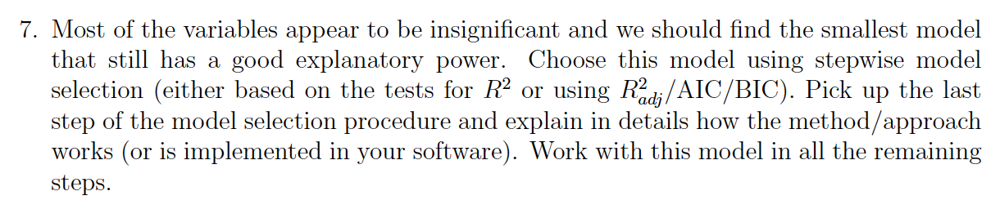

In [40]:
# Here we apply possible values to the missing cells in the data.
# Ideally, we should investigate each missing value and define appropriate imputation
# , but, for simplicity, we just filled the null values with the values that means "Not specified" and extracted dummies

# process columns
df_processed = df_train.copy()

# fix missing values to make our model not crash
df_processed.loc[df_processed["Alley"].isna(), "Alley"] = "N/A"
df_processed.loc[df_processed["GarageType"].isna(), "GarageType"] = "N/A"
df_processed.loc[df_processed["MiscFeature"].isna(), "MiscFeature"] = "N/A"
df_processed.loc[df_processed["Electrical"].isna(), "Electrical"] = "SBrkr"
df_processed.loc[df_processed["BsmtQual"].isna(), "BsmtQual"] = "NA"
df_processed.loc[df_processed["BsmtCond"].isna(), "BsmtCond"] = "NA"
df_processed.loc[df_processed["BsmtExposure"].isna(), "BsmtExposure"] = "NA"
df_processed.loc[df_processed["BsmtFinType1"].isna(), "BsmtFinType1"] = "NA"
df_processed.loc[df_processed["BsmtFinType2"].isna(), "BsmtFinType2"] = "NA"
df_processed.loc[df_processed["FireplaceQu"].isna(), "FireplaceQu"] = "NA"
df_processed.loc[df_processed["PoolQC"].isna(), "PoolQC"] = "NA"
df_processed.loc[df_processed["Fence"].isna(), "Fence"] = "NA"
df_processed.loc[df_processed["GarageFinish"].isna(), "GarageFinish"] = "NA"
df_processed.loc[df_processed["GarageQual"].isna(), "GarageQual"] = "NA"
df_processed.loc[df_processed["GarageCond"].isna(), "GarageCond"] = "NA"
df_processed.loc[df_processed["LotFrontage"].isna(), "LotFrontage"] = 0
df_processed.loc[df_processed["GarageYrBlt"].isna(), "GarageYrBlt"] = 0
df_processed.loc[df_processed["MasVnrArea"].isna(), "MasVnrArea"] = 0
# encode ordinal and make dummies
df_processed[ordinal] = df_processed[ordinal].astype("category")
df_processed[ordinal] = df_processed[ordinal].apply(lambda x: x.cat.codes)
df_processed[dummies] = df_processed[dummies].astype("object")

df_processed = pd.get_dummies(df_processed, drop_first=True)

In [41]:
import pandas as pd
import statsmodels.api as sm


def forward_selection_aic_step(X, y, included, aic, verbose=False):
    excluded = list(set(X.columns) - set(included))
    best_aic = float("inf")
    best_feature = None
    for new_column in excluded:
        model = sm.OLS(y, sm.add_constant(X[included + [new_column]])).fit()
        current_aic = model.aic
        if current_aic < best_aic:
            best_aic = current_aic
            best_feature = new_column
    if best_aic < aic:
        if verbose:
            print("Add  {:30} with AIC {:.6}".format(best_feature, best_aic))
        return (best_feature, best_aic)

    return None, aic


def backward_elimination_aic_step(X, y, included, aic, verbose=False):
    best_aic = float("inf")
    worst_feature = None
    for feature in included:
        temp_included = list(set(included) - set([feature]))
        model = sm.OLS(y, sm.add_constant(X[temp_included])).fit()
        current_aic = model.aic
        if current_aic < best_aic:
            best_aic = current_aic
            worst_feature = feature

    if best_aic < aic:
        if verbose:
            print("Drop {:30} with AIC {:.6}".format(worst_feature, best_aic))
        return (worst_feature, best_aic)

    return None, aic


def stepwise_selection_aic(X, y, threshold=0.1, verbose=False):
    feature_1, _ = forward_selection_aic_step(X, y, [], float("inf"), verbose)
    feature_2, aic = forward_selection_aic_step(
        X, y, [feature_1], float("inf"), verbose
    )
    included = [feature_1, feature_2]
    while True:
        old_aic = aic
        feature_add, aic = forward_selection_aic_step(X, y, included, aic, verbose)
        if feature_add:
            included.append(feature_add)
        feature_remove, aic = backward_elimination_aic_step(
            X, y, included, aic, verbose
        )
        if feature_remove:
            included.remove(feature_remove)

        if old_aic - aic < threshold or (
            feature_add is None and feature_remove is None
        ):
            break

    return included

In [42]:
X = df_processed.drop(columns=["SalePrice"])
y = df_processed["SalePrice"]

selected_features_forward = stepwise_selection_aic(
    X,
    y,
    verbose=True,
)
selected_features_forward

Add  OverallQual                    with AIC 35657.5
Add  GrLivArea                      with AIC 35265.6
Add  BsmtFinSF1                     with AIC 35095.5
Add  ExterQual                      with AIC 34960.6
Add  GarageCars                     with AIC 34855.7
Add  KitchenQual                    with AIC 34801.2
Add  MSZoning_RL                    with AIC 34748.7
Add  Condition2_PosN                with AIC 34696.0
Add  SaleType_New                   with AIC 34655.8
Add  Neighborhood_NoRidge           with AIC 34609.0
Add  LotArea                        with AIC 34569.2
Add  Neighborhood_NridgHt           with AIC 34531.2
Add  RoofMatl_WdShngl               with AIC 34501.1
Add  Neighborhood_StoneBr           with AIC 34471.4
Add  OverallCond                    with AIC 34437.7
Add  YearBuilt                      with AIC 34399.4
Add  Neighborhood_Crawfor           with AIC 34374.1
Add  MSSubClass_160                 with AIC 34348.1
Add  MSSubClass_120                 with AIC 3

['OverallQual',
 'GrLivArea',
 'BsmtFinSF1',
 'ExterQual',
 'GarageCars',
 'KitchenQual',
 'Condition2_PosN',
 'SaleType_New',
 'Neighborhood_NoRidge',
 'LotArea',
 'Neighborhood_NridgHt',
 'RoofMatl_WdShngl',
 'Neighborhood_StoneBr',
 'OverallCond',
 'YearBuilt',
 'Neighborhood_Crawfor',
 'MSSubClass_160',
 'MSSubClass_120',
 'KitchenAbvGr',
 'HouseStyle_1Story',
 'BsmtExposure',
 'Exterior1st_BrkFace',
 'BsmtQual',
 'Condition1_Norm',
 'MasVnrArea',
 'RoofMatl_CompShg',
 'Neighborhood_Somerst',
 'Fireplaces',
 'Functional_Typ',
 'MasVnrType_None',
 'RoofMatl_Tar&Grv',
 'RoofMatl_WdShake',
 'RoofMatl_Membran',
 'RoofMatl_Metal',
 'RoofMatl_Roll',
 'TotalBsmtSF',
 'PoolQC',
 'BedroomAbvGr',
 'SaleCondition_Normal',
 'TotRmsAbvGrd',
 'Neighborhood_BrkSide',
 'LowQualFinSF',
 'MiscFeature_TenC',
 'ScreenPorch',
 'Street_Pave',
 'LandContour_HLS',
 'WoodDeckSF',
 'Neighborhood_NWAmes',
 'LandContour_Lvl',
 'Heating_OthW',
 'SaleType_Con',
 'Functional_Sev',
 'BsmtFinSF2',
 'MoSold',
 'Gar

In [43]:
selected_model = sm.OLS(y, sm.add_constant(X[selected_features_forward])).fit()

print(selected_model.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     200.2
Date:                Thu, 18 Jan 2024   Prob (F-statistic):               0.00
Time:                        10:04:58   Log-Likelihood:                -16739.
No. Observations:                1460   AIC:                         3.363e+04
Df Residuals:                    1384   BIC:                         3.403e+04
Df Model:                          75                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.269e+06 

**Stepwise selection**

We implemented own version of stepwise feature selection process:

1) Select two the most important features (with maximum AIC)
2) Drop the worst feature if its removal makes model better 
3) Add the most important feature if its addition makes model better
4) Repeat 2-3

In all feature and model comparisons, we use AIC. The AIC penalizes models for having more parameters and introduces a balance between number of features and the varience of the residuals.

The AIC is calculated using the formula:

$AIC=ln(\hat{\sigma^2}) + \frac{2K}{N}$ where K - the number of parameters in the model, N - number of samples, $\sigma$ - the varience of the residuals

### Task 8

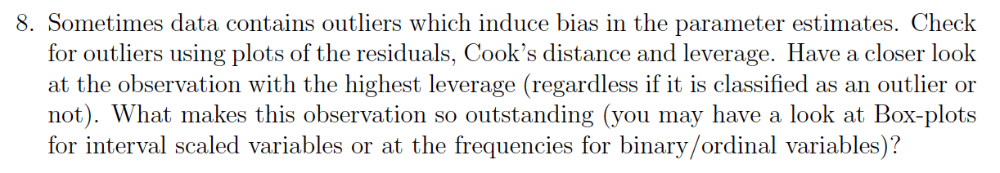

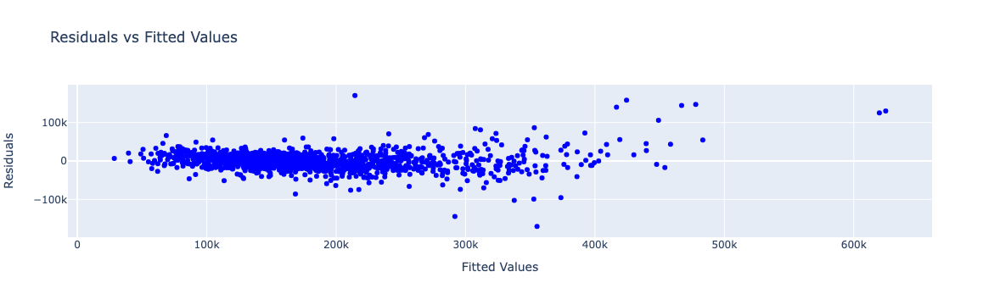

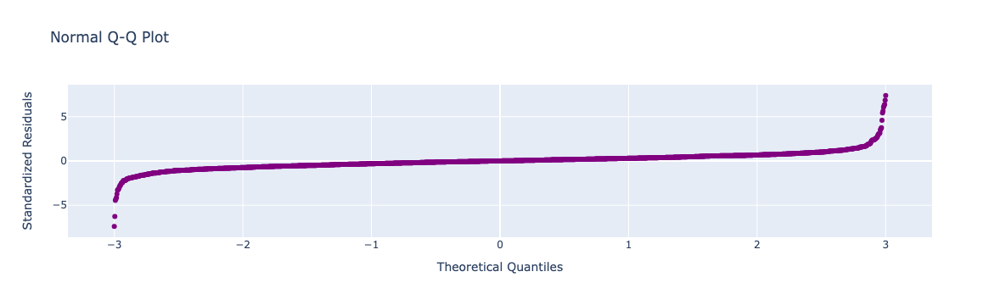

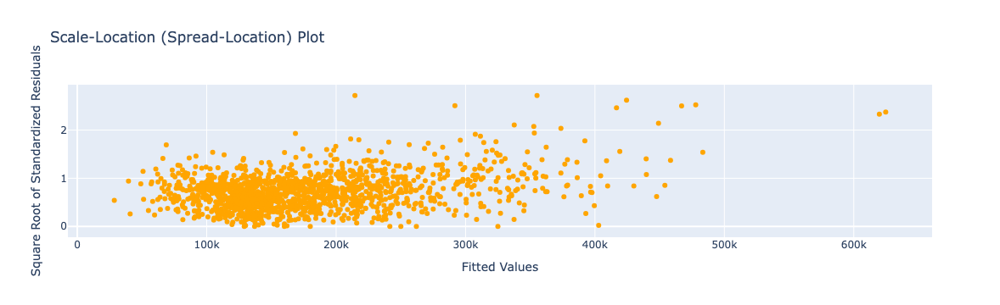

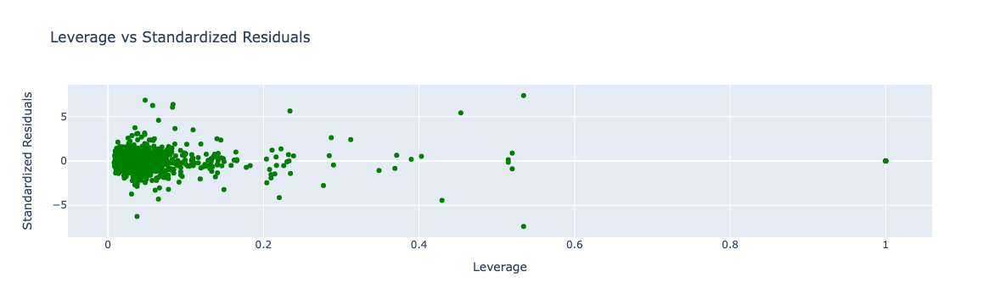

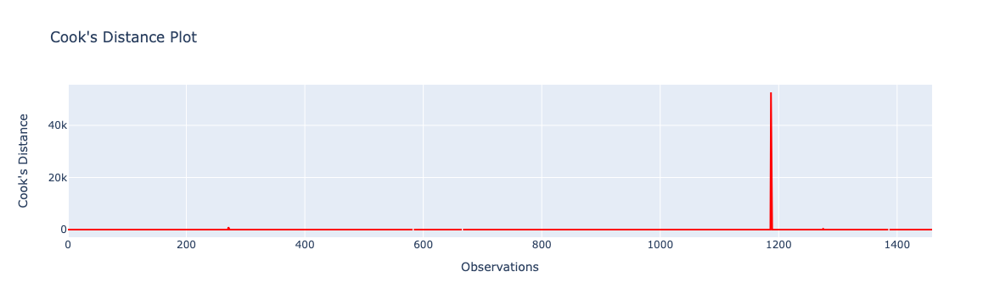

In [44]:
residuals = selected_model.resid
fitted_values = selected_model.fittedvalues

z_scores = (residuals - residuals.mean()) / residuals.std()
theoretical_quantiles = np.linspace(-3, 3, len(residuals))
theoretical_quantiles = np.sort(stats.norm.ppf(stats.norm.cdf(theoretical_quantiles)))

standardized_residuals = selected_model.resid / selected_model.resid.std()
sqrt_std_residuals = np.sqrt(np.abs(z_scores))

influence = oi.OLSInfluence(selected_model)
cook_distance = influence.cooks_distance
leverage = influence.hat_matrix_diag

# residuals vs fitted values plot
fig_res_vs_fit = go.Figure()
fig_res_vs_fit.add_trace(
    go.Scatter(
        x=fitted_values,
        y=residuals,
        mode="markers",
        marker=dict(color="blue"),
        name="Residuals vs Fitted Values",
    )
)
fig_res_vs_fit.update_layout(
    title="Residuals vs Fitted Values",
    xaxis_title="Fitted Values",
    yaxis_title="Residuals",
)

# normal Q-Q plot
fig_qq = go.Figure()
fig_qq.add_trace(
    go.Scatter(
        x=theoretical_quantiles,
        y=np.sort(z_scores),
        mode="markers",
        marker=dict(color="purple"),
        name="Normal Q-Q Plot",
    )
)
fig_qq.update_layout(
    title="Normal Q-Q Plot",
    xaxis_title="Theoretical Quantiles",
    yaxis_title="Standardized Residuals",
)

# square root of standardized residuals vs fitted Values
fig_scale_location = go.Figure()
fig_scale_location.add_trace(
    go.Scatter(
        x=fitted_values,
        y=sqrt_std_residuals,
        mode="markers",
        marker=dict(color="orange"),
        name="Scale-Location Plot",
    )
)
fig_scale_location.update_layout(
    title="Scale-Location (Spread-Location) Plot",
    xaxis_title="Fitted Values",
    yaxis_title="Square Root of Standardized Residuals",
)

# leverage vs residuals squared plot
fig_leverage_vs_std_res = go.Figure()
fig_leverage_vs_std_res.add_trace(
    go.Scatter(
        x=leverage,
        y=standardized_residuals,
        mode="markers",
        marker=dict(color="green"),
        name="Leverage vs Standardized Residuals",
    )
)
fig_leverage_vs_std_res.update_layout(
    title="Leverage vs Standardized Residuals",
    xaxis_title="Leverage",
    yaxis_title="Standardized Residuals",
)

# cook's distance plot
fig_cooks_distance = go.Figure()
fig_cooks_distance.add_trace(
    go.Scatter(
        x=np.arange(len(cook_distance[0])),
        y=cook_distance[0],
        marker=dict(color="red"),
        name="Cook's Distance",
    )
)
fig_cooks_distance.update_layout(
    title="Cook's Distance Plot",
    xaxis_title="Observations",
    yaxis_title="Cook's Distance",
)

# Display all the plots
fig_res_vs_fit.show()
fig_qq.show()
fig_scale_location.show()
fig_leverage_vs_std_res.show()
fig_cooks_distance.show()

In [139]:
df_train.iloc[np.argmax(leverage)]

1386

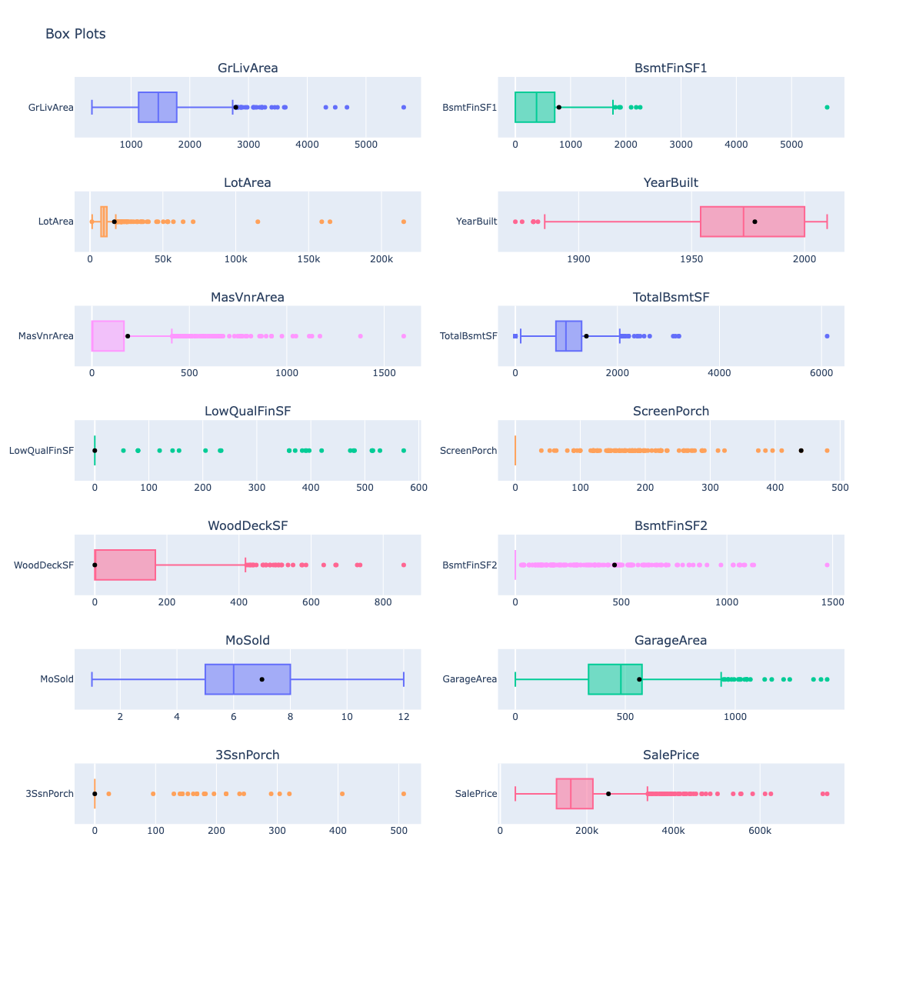

In [133]:
all_features = selected_features_forward + ["SalePrice"]
num_features = [
    column for column in all_features if column in numerical + ["SalePrice"]
]
boxplot_data = []
scatter_mean = []

fig = make_subplots(
    rows=len(num_features) // 2 + 1,
    cols=2,
    subplot_titles=num_features,
)

for i, column in enumerate(num_features):
    fig.add_trace(
        go.Box(x=df_processed[column], name=column), row=i // 2 + 1, col=i % 2 + 1
    )
    fig.add_trace(
        go.Scatter(
            x=[df_processed[column][np.argmax(leverage)]],
            y=[column],
            mode="markers",
            marker=dict(color="black"),
            showlegend=False,
        ),
        row=i // 2 + 1,
        col=i % 2 + 1,
    )

fig.update_layout(height=1300, title_text="Box Plots", showlegend=False)
fig.show()

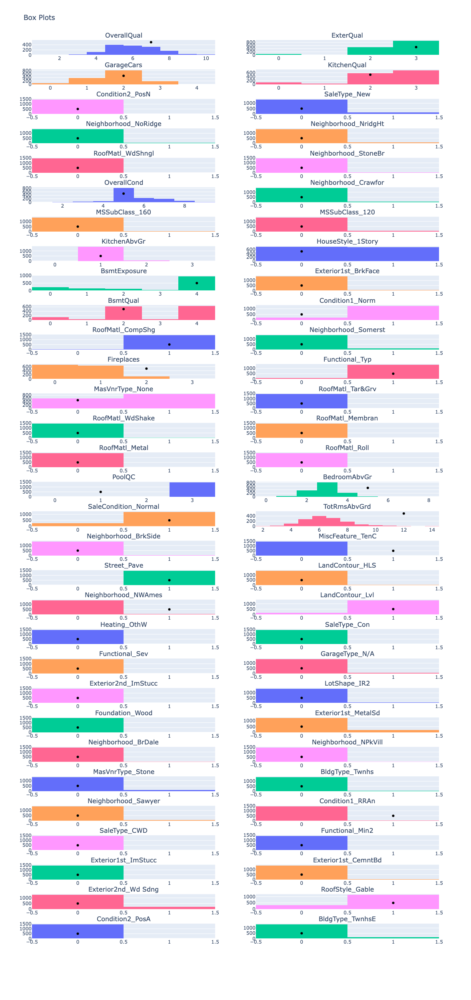

In [137]:
all_features = selected_features_forward + ["SalePrice"]
num_features = [
    column for column in all_features if column not in numerical + ["SalePrice"]
]
boxplot_data = []
scatter_mean = []

fig = make_subplots(
    rows=len(num_features) // 2 + 1,
    cols=2,
    subplot_titles=num_features,
)

for i, column in enumerate(num_features):
    fig.add_trace(
        go.Histogram(x=df_processed[column], name=column), row=i // 2 + 1, col=i % 2 + 1
    )
    fig.add_trace(
        go.Scatter(
            x=[df_processed[column][np.argmax(leverage)]],
            y=[500],
            mode="markers",
            marker=dict(color="black"),
            showlegend=False,
        ),
        row=i // 2 + 1,
        col=i % 2 + 1,
    )

fig.update_layout(height=2500, title_text="Box Plots", showlegend=False)
fig.show()

**Why observation is special?**

1) Numerical features

If we look at the position of our observation accross numerical features we can notice that about half of the positions are outside of the boxes. So, this observation has ~3 outliers, not the strongest actually, but the number is quite high. For example, we can consider ScreenPorch which value is on the 2nd place far from the box and quantiles.

2) Categorical features

Considering categorical features, this observation has a pool with level of quality that shares only 2 observations. Additionally, it share the only Miscellaneous feature, has rare Condition1, and rare Neighborhood type. As for ordinal, we can see that this observation has unusually big number of rooms above grade, especially bedrooms.

In summary, combining all features together, this observation is shown to has many features being statistically rate in our dataset. This rarity contributes to its having the highest leverage in the dataset.

### Task 9

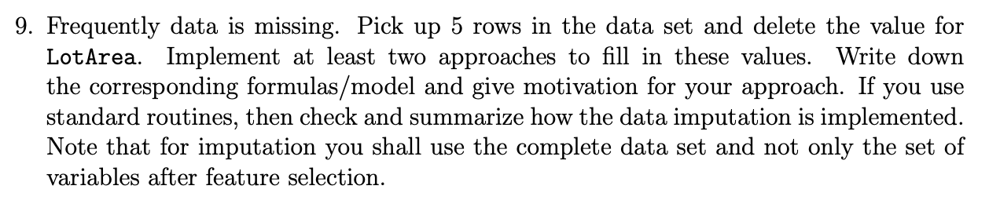

In [484]:
df_processed_missed = df_processed.copy()
rows_with_missing_values = np.random.choice(
    df_processed_missed.index, size=5, replace=False
)

In [485]:
df_processed.iloc[rows_with_missing_values]

,Id,LotFrontage,LotArea,Utilities,LotConfig,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
313,314,150.0,215245,0,4,2,7,5,1965,1965,...,0,0,0,0,1,0,0,0,1,0
1255,1256,52.0,6240,0,4,0,6,6,1931,1950,...,0,0,0,0,1,0,0,0,1,0
467,468,79.0,9480,0,4,0,5,7,1942,1995,...,0,0,0,0,1,0,0,0,1,0
1025,1026,70.0,7700,0,0,0,5,5,1972,1972,...,0,0,0,0,1,0,0,0,1,0
1320,1321,70.0,8400,0,4,0,6,3,1957,1957,...,0,0,0,0,1,0,0,0,1,0


In [491]:
# cold impultation
df_processed_missed.loc[rows_with_missing_values, "LotArea"] = np.nan

knn_imputer = KNNImputer(n_neighbors=2, weights="uniform")
df_processed_missed[df_processed_missed.columns] = knn_imputer.fit_transform(
    df_processed_missed[df_processed_missed.columns]
)

df_processed_missed.iloc[rows_with_missing_values]

,Id,LotFrontage,LotArea,Utilities,LotConfig,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
313,314.0,150.0,13001.5,0.0,4.0,2.0,7.0,5.0,1965.0,1965.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1255,1256.0,52.0,3354.0,0.0,4.0,0.0,6.0,6.0,1931.0,1950.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
467,468.0,79.0,7147.0,0.0,4.0,0.0,5.0,7.0,1942.0,1995.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1025,1026.0,70.0,7670.0,0.0,0.0,0.0,5.0,5.0,1972.0,1972.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1320,1321.0,70.0,9905.0,0.0,4.0,0.0,6.0,3.0,1957.0,1957.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [492]:
# regression impultation
df_processed_missed.loc[rows_with_missing_values, "LotArea"] = np.nan
X = df_processed_missed.drop(columns=["LotArea"])
y = df_processed_missed["LotArea"]

mask = df_processed_missed["LotArea"].isna()
missed_model = sm.OLS(y[~mask], sm.add_constant(X[~mask], has_constant="add")).fit()
df_processed_missed.loc[rows_with_missing_values, "LotArea"] = missed_model.predict(
    sm.add_constant(X[mask], has_constant="add")
).round(1)

df_processed_missed.iloc[rows_with_missing_values]

,Id,LotFrontage,LotArea,Utilities,LotConfig,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
313,314.0,150.0,46348.6,0.0,4.0,2.0,7.0,5.0,1965.0,1965.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1255,1256.0,52.0,5565.2,0.0,4.0,0.0,6.0,6.0,1931.0,1950.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
467,468.0,79.0,13511.8,0.0,4.0,0.0,5.0,7.0,1942.0,1995.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1025,1026.0,70.0,9266.6,0.0,0.0,0.0,5.0,5.0,1972.0,1972.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1320,1321.0,70.0,7834.4,0.0,4.0,0.0,6.0,3.0,1957.0,1957.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


**Conclusions**

We tried two imputation techniques.

1) Cold imputation

Using KNN algorithm (finds the closest samples comparing feature vectors) we found the closest neighbours for our missing records and filled values with mean of their values. It is usefull for us as houses are easily splitted into different categories (clusters), so there is obviously some similar houses to ours with missing values. Calculating some other imputations, like mean or using frequiencies won't work well in our case as the variable is numerical one and can vary greately from house to house.

KNN can use different distances, but generally is uses Euclidian:
$d(x,y) = \sqrt{\sum_i^n(x_i - y_i)^2}$

It works in the following way:
1) Calculate distances between all pairs of samples
2) Find k the least distance. These k will be the neighbours
3) Caclulate average of the variables and fill in the missing one with them. 


2) Regression imputation

We also tried to use regression imputations. Some of the predicted values differ completely comparing with the first approach, showing that choosing the correct imputation can bring a lot of value to the modelling. We tried this method as we have only several missing values and can try to model them. In simple words, we just fitted the regression model that predicted missing values for us:

1) We fit the linear regression model with the whole data except for the cases with missing values with LotArea as a target variable
2) We predict missing values with the corresponding features and assign them to the data

In summary, if you can model the missing values quite well it is the best option. However, not always it is possible. In our case, the ajd R^2 for the prediction of LotArea is about 0.5. This means that model is far from being effective in predicting such values and it is preffered to consider other options like KNN. It is very simple and pretty usefull approach if you have enough data.

### Task 10

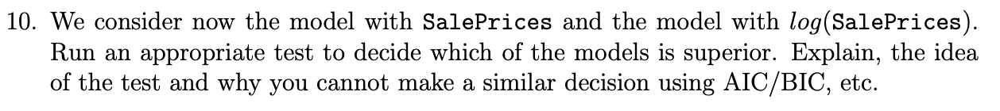

In [407]:
X = df_processed.drop(columns=["SalePrice"])
y = df_processed["SalePrice"]
log_y = np.log(df_processed["SalePrice"])

selected_model_linear = sm.OLS(y, sm.add_constant(X[selected_features_forward])).fit()
selected_model_log_linear = sm.OLS(
    log_y, sm.add_constant(X[selected_features_forward])
).fit()

linear_results = selected_model_linear.predict(
    sm.add_constant(X[selected_features_forward])
)
linear_log_results = selected_model_log_linear.predict(
    sm.add_constant(X[selected_features_forward])
)

print(
    sm.OLS(y, sm.add_constant(np.log(linear_results) - linear_log_results))
    .fit()
    .pvalues.iloc[1]
)

print(
    sm.OLS(y, sm.add_constant(linear_results - np.exp(linear_log_results)))
    .fit()
    .pvalues.iloc[1]
)

0.0005517957098995947
2.464052284170452e-15


**Conclusions**

Here we concluded two different tests, the first one is the test to define whether the linear model better than the log-linear. To perform it, we constructed new model from predictions log differences (as the features are identical). After fitting this model we extracted p-value of the corresponding parameter, with which we basically can deside if the parameter has effect on the model. The hypothesis can be formulated as: does log-linear model has additional valuable information? 

$y_i = x^`_i\beta + \sigma_{lin}(ln\hat{y_i} - \hat{lny_i}) + u_i$, $x^`_i$ - represents variables that are not in the linear model

The p-value is close to 0, so we can reject the hypothesis and conclude that log model does not has additional valuable information.

The second test is similar to the first one, but used to define whether log-linear better than the linear. The hypothesis can be formulated as: does linear model has additional valuable information?

$lny_i = x^`_i\beta + \sigma_{log}(\hat{y_i} - exp(\hat{lny_i}) + u_i$, $x^`_i$ - represents variables that are not in the log model

Also, the p-value is close to 0, we can reject the hypothesis and concluse that linear model does not have additional valuable information.

In summary, we can see that there are no better model, they are identical in the predictive power.

**Why AIC/BIC not working?**

For AIC and BIC target, to make valid comparison the target variable for all compared models should be the same. 

Both AIC and BIC involve the log-likelihood function of the model. The log-likelihood quantifies how well the model explains the observed data. Mixing response variables introduces inconsistencies in the likelihood function. For example, if one model uses the raw response variable log(y) and another uses y, the likelihood functions are inherently different.

### Task 11

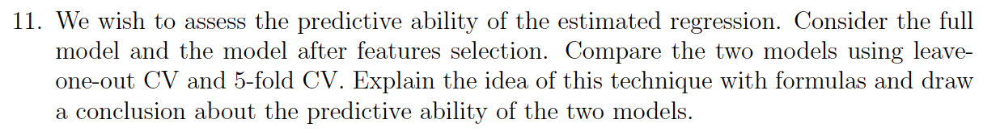

In [388]:
X = df_processed.drop(columns=["SalePrice"])
y = df_processed["SalePrice"]

columns_selection = [X.columns, selected_features_forward]
splits = [5, len(X)]
means = []

for split in splits:
    for columns in columns_selection:
        mse_list = []
        for train_index, test_index in tqdm(
            list(KFold(n_splits=split).split(X[columns]))
        ):
            X_train, X_test = X[columns].iloc[train_index], X[columns].iloc[test_index]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            model = sm.OLS(y_train, sm.add_constant(X_train, has_constant="add")).fit()
            y_pred = model.predict(sm.add_constant(X_test, has_constant="add"))

            mse = mean_squared_error(y_test, y_pred)
            mse_list.append(mse)

        means.append(np.mean(mse_list))

means

100%|█████████████████████████████████████████████████████████████████████████████████| 1460/1460 [01:08<00:00, 21.30it/s]


[2227240436.998807, 1858950594.9000816, 2338124861.6094995, 2032630717.7397528]

**Conclusions**

**a)Ideas**

In concept leave-one-out CV, we estimate model n times (n - number of samples) and on each iteration drop i-th sample from the train dataset and use it to validate model. The resultive goodness-of-fit measure is the average loss of all estimations.

$CV = \frac{1}{n}\sum^{n}_{i=1}MSE_i$, where i - index of sample, $MSE_i = (\hat{y_i} - y_i)^2$ - squared difference between prediction on i-th iteration and real value.

The drawback of the LOOCV is the fact that we need to fit model n times, which can be quite uneffective. For that reason, kFold CV was introduced. The idea is to split model on k (k - parameter for this type of CV) equal parts (folds) and make only k fits using them. It works in the way that k-ith fold is used to validate the model and the rest k-1 to train it.

$CV = \frac{1}{k}\sum^{k}_{i=1}MSE_i$, i - index of fold (validation dataset), where $MSE_i = \frac{1}{n}\sum^{n}_{i=1}(\hat{Y_i} - Y_i)^2$ - squared differences between predictions for i-th fold and real values, n - the number of samples in fold.

**b)Predictive ability**

kFold CV with 5 folds: 

All features: 2,227,240,436.998807

Stepwise selected features: 1,858,950,594.9000816

We see decrease in the goodness-of-fit measure (which is good) by ~16.5%.

LOOCV:

All features: 2,338,124,861.6094995

Stepwise selected features: 2,032,630,717.7397528

We see decrease in the goodness-of-fit measture by ~13.1%.

Generally, both methdods showed that model with stepwise selected features works better than the model that uses all features, reducing loss at least by ~13% from the original model.

## Problem 6

### Task 1

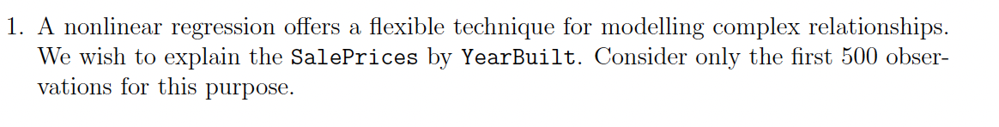

In [156]:
df_non_linear = (
    df_train[["SalePrice", "YearBuilt"]].iloc[:500].sort_values(by="YearBuilt")
)

X = df_non_linear["YearBuilt"]
y = df_non_linear["SalePrice"]

#### a) 

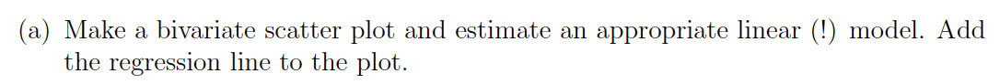

In [157]:
non_linear_linear = sm.OLS(y, sm.add_constant(X)).fit()
non_linear_linear_predictions = non_linear_linear.predict(
    sm.add_constant(X, has_constant="add")
)
print(non_linear_linear.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     216.5
Date:                Thu, 18 Jan 2024   Prob (F-statistic):           5.86e-41
Time:                        12:16:56   Log-Likelihood:                -6254.8
No. Observations:                 500   AIC:                         1.251e+04
Df Residuals:                     498   BIC:                         1.252e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.671e+06   1.94e+05    -13.773      0.0

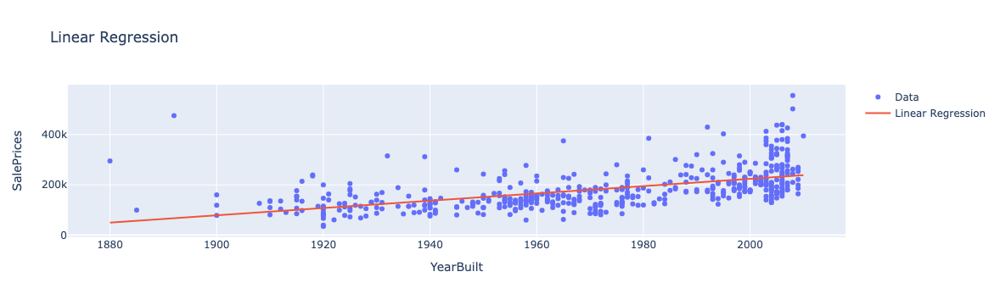

In [158]:
fig_linear = go.Figure()

fig_linear.add_trace(
    go.Scatter(
        x=df_non_linear["YearBuilt"],
        y=df_non_linear["SalePrice"],
        mode="markers",
        name="Data",
    )
)
fig_linear.add_trace(
    go.Scatter(
        x=df_non_linear["YearBuilt"],
        y=non_linear_linear_predictions,
        mode="lines",
        name="Linear Regression",
    )
)

fig_linear.update_layout(
    title="Linear Regression", xaxis_title="YearBuilt", yaxis_title="SalePrices"
)

#### b) 

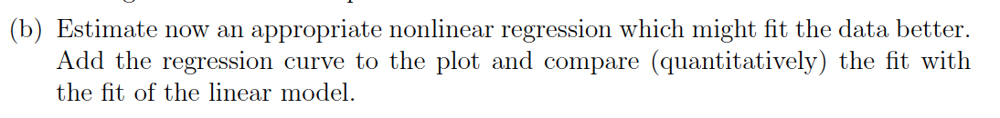

In [159]:
non_linear_non_linear = sm.OLS(y, sm.add_constant(np.column_stack([X, X**2]))).fit()
non_linear_non_linear_predictions = non_linear_non_linear.predict(
    sm.add_constant(np.column_stack([X, X**2]), has_constant="add")
)
print(non_linear_non_linear.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     164.1
Date:                Thu, 18 Jan 2024   Prob (F-statistic):           1.85e-55
Time:                        12:16:57   Log-Likelihood:                -6218.3
No. Observations:                 500   AIC:                         1.244e+04
Df Residuals:                     497   BIC:                         1.246e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.005e+08   1.17e+07      8.612      0.0

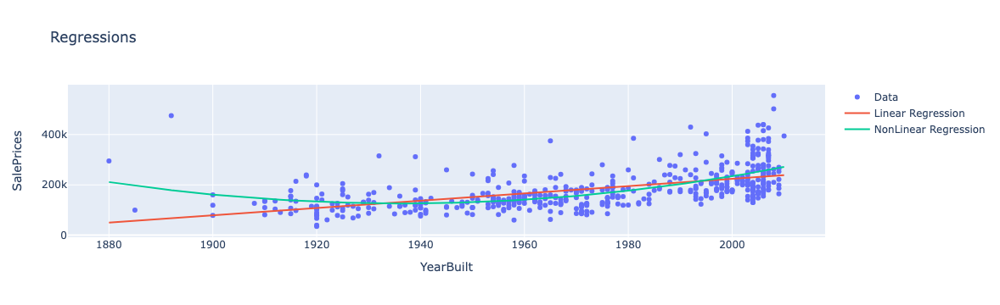

In [160]:
fig_linear = go.Figure()

fig_linear.add_trace(
    go.Scatter(
        x=df_non_linear["YearBuilt"],
        y=df_non_linear["SalePrice"],
        mode="markers",
        name="Data",
    )
)
fig_linear.add_trace(
    go.Scatter(
        x=df_non_linear["YearBuilt"],
        y=non_linear_linear_predictions,
        mode="lines",
        name="Linear Regression",
    )
)
fig_linear.add_trace(
    go.Scatter(
        x=df_non_linear["YearBuilt"],
        y=non_linear_non_linear_predictions,
        mode="lines",
        name="NonLinear Regression",
    )
)

fig_linear.update_layout(
    title="Regressions", xaxis_title="YearBuilt", yaxis_title="SalePrices"
)

In [161]:
mse_non_linear_linear = mean_squared_error(y, non_linear_linear_predictions)
mse_non_linear_non_linear = mean_squared_error(y, non_linear_non_linear_predictions)

print(f"MSE for Linear: {mse_non_linear_linear}")
print(f"MSE for Non-Linear: {mse_non_linear_non_linear}")
print(f"Reduction: {1 - mse_non_linear_non_linear / mse_non_linear_linear}")

MSE for Linear: 4297426767.369776
MSE for Non-Linear: 3713257712.892928
Reduction: 0.1359346153173393


**Comparison**

Polinomial model (degree=2) fits better and reduces MSE by ~13.6%. 

This is another proof that capturing the dependecy between selected features will require non-linearity in the model.

#### c) 
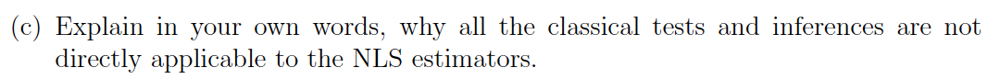

Classical tests and inferences often rely on certain assumptions that may not hold in the case of non-linear models. For example, to make inferences we need statistical assumptions (Mean of the residuals, Homoscedastivity, No autocorrelation, Normal distribution). Non-linear models might introduce non-normalities in the error structure, violating these assumptions. For example, the distribution of parameters in non-linear model is not Gaussian, while in linear model it is. 

#### d) 
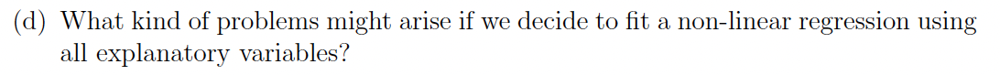

First and foremost, we can face overfitting problems, when the model captures all the data noice, instead of fitting generalized knowledge about trends. The next issues we can face are complexity and interpretability. Non-linear functions can contain complex computations, the more variables we add the harder to compute and interpret the results. The last, but not least is the collinearity issues, when two or more variables in the model are highly correlated. This can bring the instability to the parameters.

### Task 2

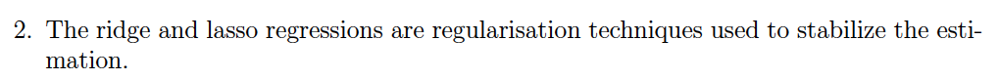

#### a) 

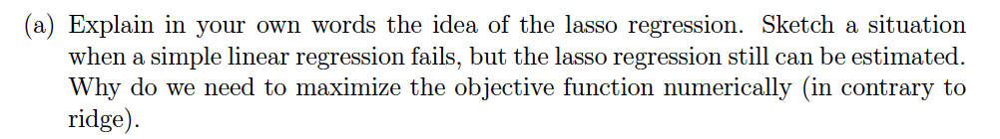

**a) Idea**

The regression concept introduces the penalization function to the optimization function that depends on the magnitude of the parameters. This idea forces model to minimize the values of the parameters in order to make loss smaller. In the Lasso regression, we work with the penalization of absolute model values, which makes model to minimize the absolute sum of the parameters along with loss itlself. So, at the end, the model often makes parameters zero to minimize sum, leaving only ones that closest to the optimal values to minimize loss.

**b) Situation**

Imagine the situation when the simple linear regression model has many of highly correlated parameters (multicollinear). For the simple linear regression model, it would be hard to distinguish between these features and make stable predictions. On the other hand, by penalizing less important varibles and making them 0, Lasso regression could select the most importand ones, reducing the multicollinearity and making stable predictions.

**c) Numerical maximization**

The ridge regression can be estimated analytically because its penalty function is differentiable, in contrary to the lasso regression, where the penalty function (absolute value) is not differentiable at 0. This is the proble, as the lasso regression tends to make variable's parameters 0.

#### b) 
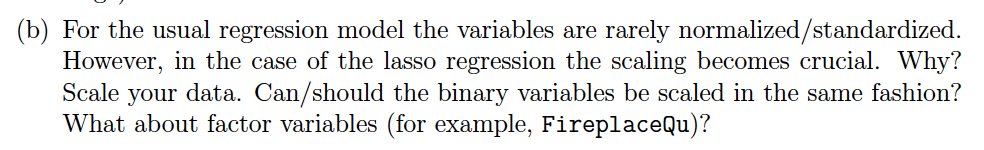

**Normalization/standartization**

It is crucial for regularization, because penalty term involves comparing the parameters. When the variables are on different scales, the variables with larger magnitudes can dominate the penalty. It means variables with smaller magnitude coefficients are likely to shrunk to zero. So, to make them comparable, we apply normalization/standartization.

**Binary Variables scale**

According to the author of the Lasso regression, all features, including dummies should be scaled, so that the penalization scheme is fair to all regressors. Actually, this logic is implemented in many software like R.

**Factory variables scale**

For the nominal variables just transform them to dummies and work with them (they are binary). For the ordinal variables like FireplaceQu, it is reasonable to make scaling, preserving the order of categories and making them lie in the same scale as the rest of the features.

In [258]:
# scale data
scaler = StandardScaler()
df_scaled = df_processed.copy()
features_to_scale = list(df_scaled.columns)
features_to_scale.remove("Id")

df_scaled[features_to_scale] = scaler.fit_transform(df_scaled[features_to_scale])

df_scaled.describe().loc[["std"]].values > 1.001

array([[ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

In [259]:
X = df_scaled.drop(columns=["SalePrice"])
y = df_scaled["SalePrice"]

#### c)

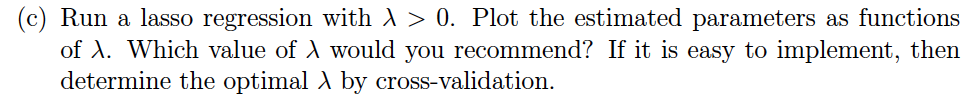

In [302]:
alphas = np.logspace(-6, 6, 100)

In [303]:
alphas_path, coef_path, _ = lasso_path(X, y, alphas=alphas)

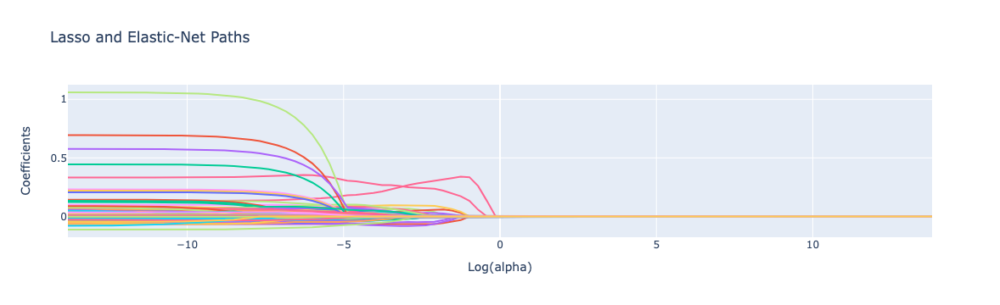

<Figure size 640x480 with 0 Axes>

In [325]:
plt.figure(1)
log_alphas_lasso = np.log(alphas_path)

fig = go.Figure()

for coef_l in coef_path:
    fig.add_trace(go.Scatter(x=log_alphas_lasso, y=coef_l, mode="lines"))

fig.update_layout(
    xaxis_title="Log(alpha)",
    yaxis_title="Coefficients",
    title="Lasso and Elastic-Net Paths",
    showlegend=False,  # Adjust as needed
)

fig.show()

In [327]:
np.exp(-4.4)

0.012277339903068436

**Plot**

If we look at the plot somewhere about Log(aplha)=-4.4, $\lambda=0.0123$ many feature's parameters are shrunked to zero. This is the the first cluster of such parameters. It means that they are less important than the others, which are shrunk later with bigger alpha. So, we would recommend to take this value as an optimal.

In [318]:
lasso_cv = LassoCV(alphas=alphas, cv=5)
lasso_cv.fit(X, y)

optimal_alpha = lasso_cv.alpha_
print(f"Optimal Alpha (Lambda): {optimal_alpha}")

Optimal Alpha (Lambda): 0.013219411484660288


#### d)

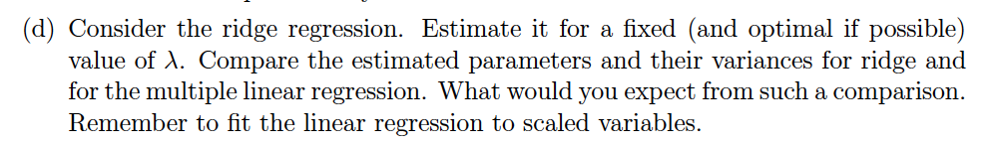

In [307]:
ridge_cv = RidgeCV(alphas=alphas, cv=5)
ridge_cv.fit(X, y)

optimal_alpha_ridge = ridge_cv.alpha_
print(f"Optimal Alpha Ridge (Lambda): {optimal_alpha_ridge}")

Optimal Alpha Ridge (Lambda): 533.6699231206302


In [308]:
ridge_reg = Ridge(alpha=optimal_alpha_ridge)
ridge_reg.fit(X, y)

linear_reg = LinearRegression()
linear_reg.fit(X, y)

LinearRegression()

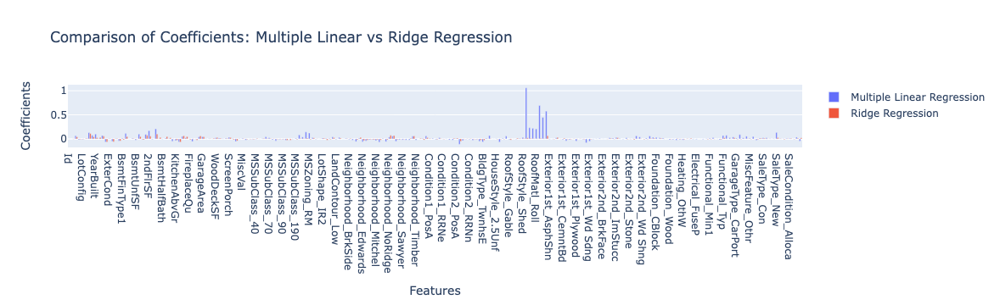

In [309]:
feature_names = X.columns
linear_reg_coeffs = linear_reg.coef_
ridge_reg_coeffs = ridge_reg.coef_

fig = go.Figure()
fig.add_trace(
    go.Bar(x=feature_names, y=linear_reg_coeffs, name="Multiple Linear Regression")
)
fig.add_trace(go.Bar(x=feature_names, y=ridge_reg_coeffs, name="Ridge Regression"))
fig.update_layout(
    title="Comparison of Coefficients: Multiple Linear vs Ridge Regression",
    xaxis_title="Features",
    yaxis_title="Coefficients",
)
fig.show()

In [310]:
1 - ridge_reg.coef_.sum() / linear_reg.coef_.sum()
# sum of ridge coefficient is much smaller than the linear one (83% reduction)

0.8340494176701125

In [311]:
np.std(linear_reg.coef_), np.std(ridge_reg.coef_)

(0.10772319717514482, 0.02296204901629271)

**Conclusions**

The variances of the coefficients in Ridge Regression should be smaller than the variances in Multiple Linear Regression due to the regularization term. Ridge Regression tends to shrink the coefficients towards zero, potentially making them smaller compared to the coefficients in Multiple Linear Regression.

### Task 3

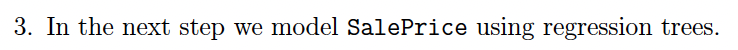

#### a)

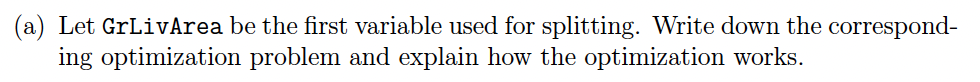

**Optimization Problem**

In regression trees our goal is to split explanatory variables into disjunct regions (rectanges).

Optimization problem looks like this: $\sum^P_{p=1}\sum_{i \in R_p}(y_i - \hat{y_{R_p}})^2$ -> minimize with respect to $R_p$

P - number of rectangles, R - rectangle, $y_{R_p}$ - mean of observations in p-th rectangle R

In simpler terms, we are seeking to find the optimal rectangles that minimize the variability of the response variable in each region.

**Optimization flow**

Optimization flow contains from the two steps:

1) Find $X_j$ and splitting point s, which separates the space into 2 regions:

    $R_1(j, s) = \{X|X_j \le s\}$ and $R_2(j, s) = \{X|X_j \gt s\}$
    
    j and s are determined using:
    
    $\sum_{i:x_i \in R_1(j,s)}(y_i - \hat{y_{R_1}})^2 + \sum_{i:x_i \in R_2(j,s)}(y_i - \hat{y_{R_2}})^2$, $y_{R_{1-2}}$ - averages of observations in $R_1$ and $R_2$ rectangles

2) Repeat Step 1 to split $R_1$ and $R_2$ recursively


The first step is simply derived from the optimization problem. 

We need to minimize $\sum^P_{p=1}\sum_{i \in R_p}(y_i - \hat{y_{R_p}})^2$ for every R, so loss of the most optimal split will be the sum of minimal losses of splitted regions. So, we seek for splitting point s and variable j that minimize both losses of R's.

#### b)

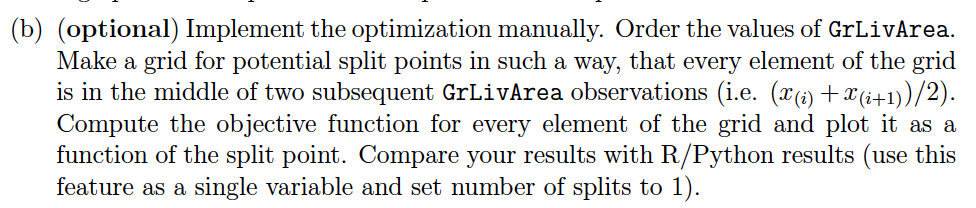

In [768]:
grlivarea = df_processed["GrLivArea"]
sorted_grlivarea = np.sort(df_processed["GrLivArea"])

split_points = (sorted_grlivarea[:-1] + sorted_grlivarea[1:]) / 2


def compute_mse(y, split_point):
    left_mask = y <= split_point
    right_mask = ~left_mask
    left_mean = np.mean(y[left_mask])
    right_mean = np.mean(y[right_mask])
    mse = np.mean((y[left_mask] - left_mean) ** 2) + np.mean(
        (y[right_mask] - right_mean) ** 2
    )
    return mse


objective_values = [compute_mse(grlivarea, split_point) for split_point in split_points]

tree_model_own = DecisionTreeRegressor(max_depth=1)
tree_model_own.fit(grlivarea.values.reshape(-1, 1), df_processed["SalePrice"])

tree_split_point = tree_model_own.tree_.threshold[0]

tree_split_point, split_points[np.argmin(objective_values)]

(1488.0, 1272.5)

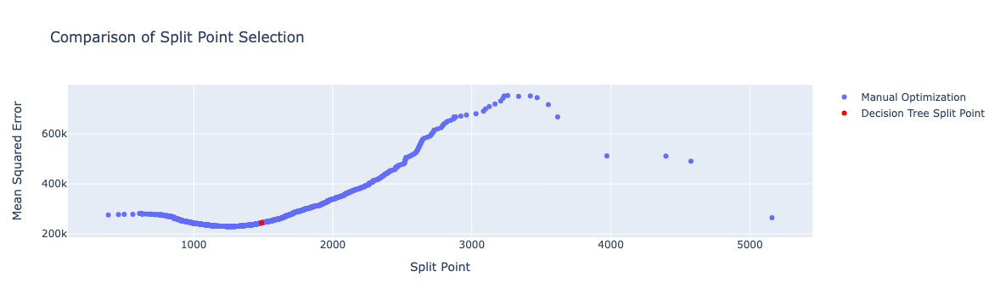

In [769]:
trace_manual = go.Scatter(
    x=split_points, y=objective_values, mode="markers", name="Manual Optimization"
)
trace_decision_tree = go.Scatter(
    x=[tree_split_point],
    y=[compute_mse(grlivarea, tree_split_point)],
    mode="markers",
    marker=dict(color="red"),
    name="Decision Tree Split Point",
)
layout = go.Layout(
    xaxis=dict(title="Split Point"),
    yaxis=dict(title="Mean Squared Error"),
    title="Comparison of Split Point Selection",
    showlegend=True,
)
fig = go.Figure(data=[trace_manual, trace_decision_tree], layout=layout)
fig.show()

#### c)

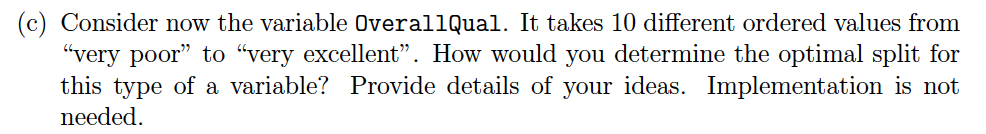

When dealing with a categorical variable like OverallQual, which represents ordered values such as "very poor" to "very excellent," the process of finding the optimal split is slightly different compared to continuous variables. Since the values are ordered, we typically look for splits that group adjacent categories together to capture any inherent order or trend in the variable.

For each pair of adjacent levels, consider a split that combines those levels into one group while keeping the other levels separate.

In our case, we consider all groups from 1 to 9 categories to determine the optimal split.

#### d)
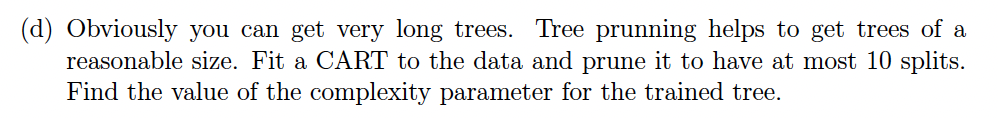

In [475]:
X = df_processed.drop(columns=["SalePrice"])
y = df_processed["SalePrice"]

tree_reg = DecisionTreeRegressor(random_state=0)
tree_reg.fit(X, y)

path = tree_reg.cost_complexity_pruning_path(X, y)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [476]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeRegressor(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X, y)
    clfs.append(clf)

In [477]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

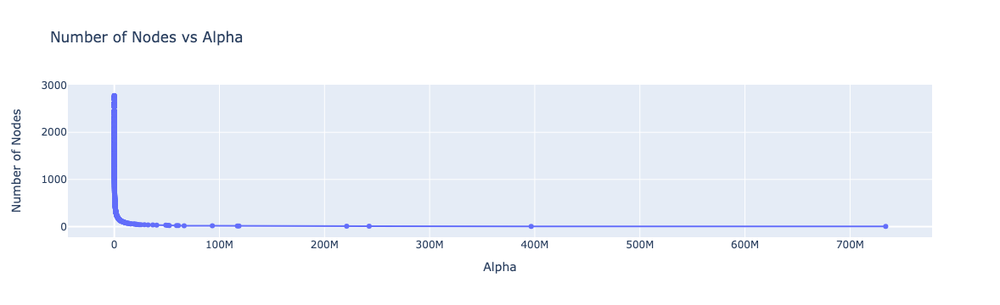

In [478]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=ccp_alphas, y=node_counts, mode="lines+markers", name="Number of Nodes"
    )
)
fig.update_layout(
    title="Number of Nodes vs Alpha",
    xaxis=dict(title="Alpha"),
    yaxis=dict(title="Number of Nodes"),
)
fig.show()

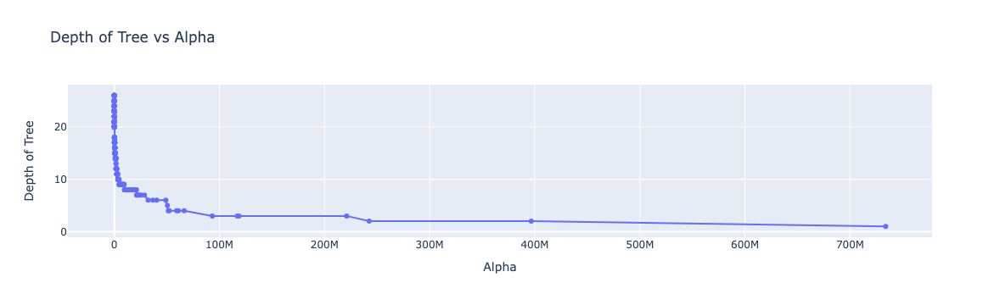

In [479]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=ccp_alphas, y=depth, mode="lines+markers", name="Depth of Tree")
)
fig.update_layout(
    title="Depth of Tree vs Alpha",
    xaxis=dict(title="Alpha"),
    yaxis=dict(title="Depth of Tree"),
)
fig.show()

In [480]:
# where not more than 21 node (10splits)
print("alpha: ", ccp_alphas[-9], " nodes:", node_counts[-9])
print("alpha: ", ccp_alphas[-8], " nodes:", node_counts[-8])

alpha:  60929792.73300138  nodes: 19
alpha:  66432662.328151494  nodes: 17


In [481]:
tree_reg_prunned = DecisionTreeRegressor(ccp_alpha=94095286.30535021)
tree_reg_prunned.fit(X, y)

DecisionTreeRegressor(ccp_alpha=94095286.30535021)

#### e)

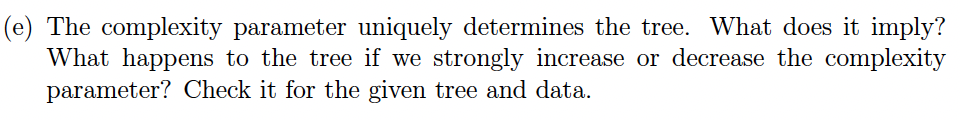

The complexity parameter (ccp_alpha) in decision trees is a regularization parameter that controls the trade-off between the complexity of the tree and its goodness of fit to the training data. For a constant dataset and complexity parameter, there is only one optimal pruned tree that minimizes the cost-complexity measure. That is why this parameter uniquely determines the tree.

With strong increase in the complexity parameter we get more aggresive prunning, leading to a simpler and more shallow tree and vise-versa with the strong descrease.

In our case, we have one of the biggest complexities (8th from the end, alpha=94095286.31). It shows that the model need to be regularized aggressively to prevent having more than 10 splits (21 nodes).

#### f)

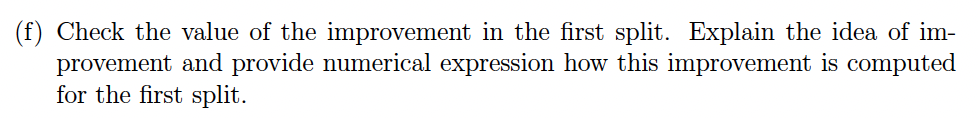

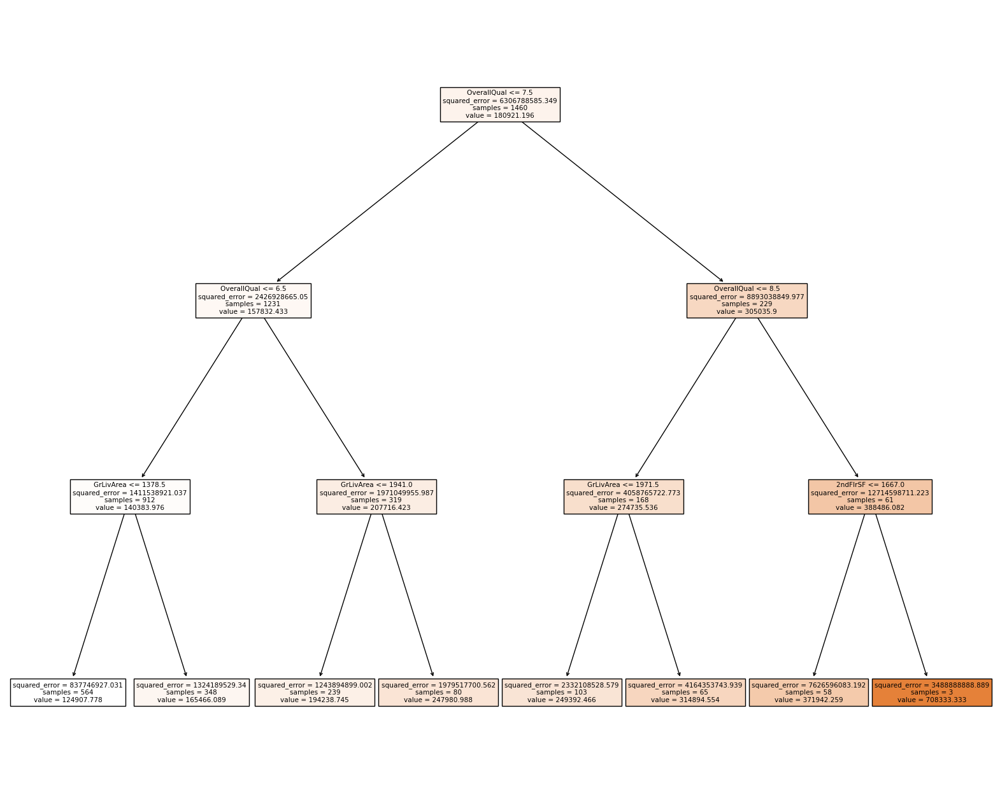

In [482]:
plt.figure(figsize=(20, 16))
plot_tree(
    tree_reg_prunned,
    filled=True,
    feature_names=X.columns,
)
plt.show()

In [483]:
children_left = tree_reg_prunned.tree_.children_left
children_right = tree_reg_prunned.tree_.children_right
features = tree_reg_prunned.tree_.feature
names = [X.columns[i] if i > 0 else "" for i in features]
thres = tree_reg_prunned.tree_.threshold
impurities = tree_reg_prunned.tree_.impurity

pd.DataFrame(
    {
        "children_left": children_left,
        "children_right": children_right,
        "names": names,
        "features": features,
        "thresholds": thres,
        "impurities": impurities,
    }
)

,children_left,children_right,names,features,thresholds,impurities
0,1,8,OverallQual,6,7.5,6.306789e+09
1,2,5,OverallQual,6,6.5,2.426929e+09
2,3,4,GrLivArea,26,1378.5,1.411539e+09
3,-1,-1,,-2,-2.0,8.377469e+08
4,-1,-1,,-2,-2.0,1.324190e+09
5,6,7,GrLivArea,26,1941.0,1.971050e+09
6,-1,-1,,-2,-2.0,1.243895e+09
7,-1,-1,,-2,-2.0,1.979518e+09
8,9,12,OverallQual,6,8.5,8.893039e+09
9,10,11,GrLivArea,26,1971.5,4.058766e+09


**Improvement**

In regression problem, our goal to minimize the MSE (or other similar metric). So, the split should be selected in a way that sum of errors of new nodes was less than the parent node. 

It it formulated as:

Parent: $MSE_{1} = \frac{1}{K_1}\sum_{k=1}^{K_1}(y_k - \hat{y}_{parent})^2$

Left Child: $MSE_{2} = \frac{1}{K_2}\sum_{k=1}^{K_2}(y_k - \hat{y}_{left-child})^2$

Right Child: $MSE_{3} = \frac{1}{K_3}\sum_{k=1}^{K_3}(y_k - \hat{y}_{right-child})^2$

where $K_i$ - number of samples in node, $y_k$ - real y values for the samples of k-th node , $y_{node}$ - mean prediction in the node

Improvement = $\frac{MSE_{1}K_1 - (MSE_{2}K_2 + MSE_{3}K_3)}{MSE_{1}K_1}$

So, simply, improvement is the reduction in MSE error ratio for a sample in node. Higher values for improvement indicate a more significant reduction in MSE, and a more optimal split.

In [497]:
parent_mse = tree_reg.tree_.impurity[0]
left_child_mse = tree_reg.tree_.impurity[1]
right_child_mse = tree_reg.tree_.impurity[8]

improvement = 1 - (1231 * left_child_mse + 229 * right_child_mse) / (1460 * parent_mse)

improvement

0.6754474651523099

The first split made an improvement by 67.5% in the MSE reduction

#### g)

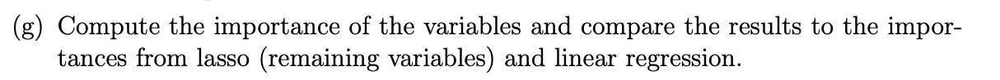

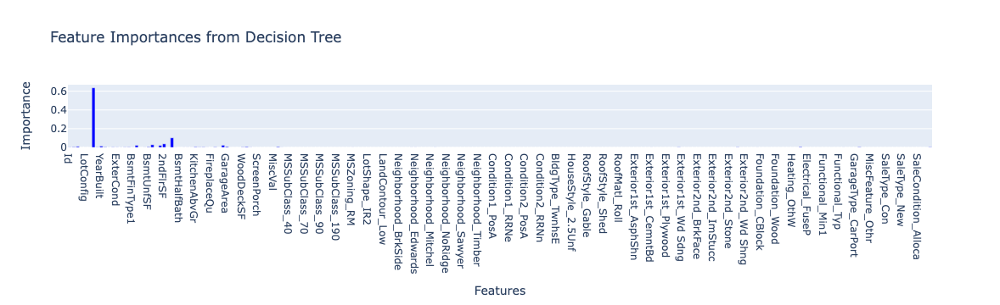

In [498]:
fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=X.columns,
        y=tree_reg.feature_importances_,
        marker_color="blue",
        name="Decision Tree",
    )
)
fig.update_layout(
    title="Feature Importances from Decision Tree",
    xaxis=dict(title="Features"),
    yaxis=dict(title="Importance"),
)
fig.show()

In [499]:
linear_coef_df = pd.DataFrame({"Feature": X.columns, "Coefficient": linear_reg.coef_})
top10_linear_coef = linear_coef_df.nlargest(10, "Coefficient")

ridge_coef_df = pd.DataFrame({"Feature": X.columns, "Coefficient": ridge_reg.coef_})
top10_ridge_coef = ridge_coef_df.nlargest(10, "Coefficient")

tree_importances_df = pd.DataFrame(
    {"Feature": X.columns, "Importance": tree_reg.feature_importances_}
)
top10_tree_importances = tree_importances_df.nlargest(10, "Importance")

print("Top 10 Features and Coefficients (Linear Regression):")
print(top10_linear_coef)

print("\nTop 10 Features and Coefficients (Ridge Regression):")
print(top10_ridge_coef)

print("\nTop 10 Features and Importances (Decision Tree):")
print(top10_tree_importances)

Top 10 Features and Coefficients (Linear Regression):
              Feature  Coefficient
137  RoofMatl_CompShg     1.060298
141  RoofMatl_Tar&Grv     0.694041
143  RoofMatl_WdShngl     0.576598
142  RoofMatl_WdShake     0.446012
138  RoofMatl_Membran     0.232060
139    RoofMatl_Metal     0.220352
26          GrLivArea     0.208167
140     RoofMatl_Roll     0.207094
24           2ndFlrSF     0.170103
71        MSZoning_RL     0.143312

Top 10 Features and Coefficients (Ridge Regression):
                  Feature  Coefficient
6             OverallQual     0.110170
26              GrLivArea     0.098640
96   Neighborhood_NoRidge     0.072757
23               1stFlrSF     0.071579
97   Neighborhood_NridgHt     0.069364
143      RoofMatl_WdShngl     0.066314
34           TotRmsAbvGrd     0.063183
39             GarageCars     0.060082
103  Neighborhood_StoneBr     0.057558
24               2ndFlrSF     0.055661

Top 10 Features and Importances (Decision Tree):
        Feature  Importance


**Comparison**

For different models there are some common features that are considered important (GrLivArea, 2ndFlrSF, etc.). However, there are plenty of differences (Roof_*, OverallQual). This can be explained by the understanding of what is the feature importance in different models. For example, in decision trees the importances are based on how often features are used for splitting across all the trees in the forest (the sum of improvements). In Lasso regression, coefficients shows the strength of the relationship with the target variable. In linear regression, coefficients represent the change in the target variable for a one-unit change in the predictor variable.

Basically, the parameter's purposes are different, that is why we can see differences in features.

#### h)

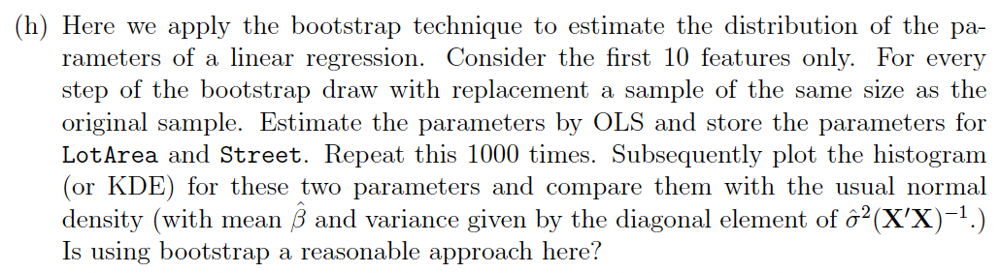

In [542]:
df_boot = df_train.iloc[:, 1:11].copy()

ordinal_boot = ["Utilities"]
numerical_boot = ["LotFrontage", "LotArea"]
dummies_boot = list(set(df_boot.columns) - set(ordinal_boot) - set(numerical_boot))

df_boot.loc[df_boot["Alley"].isna(), "Alley"] = "N/A"
df_boot.loc[df_boot["LotFrontage"].isna(), "LotFrontage"] = 0
df_boot[ordinal_boot] = df_boot[ordinal_boot].astype("category")
df_boot[ordinal_boot] = df_boot[ordinal_boot].apply(lambda x: x.cat.codes)
df_boot[dummies_boot] = df_boot[dummies_boot].astype("object")
df_boot = pd.get_dummies(df_boot, drop_first=True)

df_boot.columns[1], df_boot.columns[21]

('LotArea', 'Street_Pave')

In [722]:
X = df_boot
y = df_train["SalePrice"]

n_bootstrap = 1000

bootstrap_coefs_lotarea = np.zeros(n_bootstrap)
bootstrap_coefs_street = np.zeros(n_bootstrap)

for i in tqdm(range(n_bootstrap)):
    X_bootstrap, y_bootstrap = resample(X, y, replace=True, random_state=i)

    model = sm.OLS(y_bootstrap, sm.add_constant(X_bootstrap, has_constant="add")).fit()

    bootstrap_coefs_lotarea[i] = model.params["LotArea"]
    bootstrap_coefs_street[i] = model.params["Street_Pave"]

100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:13<00:00, 74.61it/s]


In [851]:
regular_linear_model = sm.OLS(y, sm.add_constant(X, has_constant="add")).fit()
regular_linear_model_coefs = regular_linear_model.params
regular_linear_model_errors = regular_linear_model.bse

regular_coef_lotarea = regular_linear_model_coefs["LotArea"]
regular_coef_lotarea_error = regular_linear_model_errors["LotArea"]
regular_coef_street = regular_linear_model_coefs["Street_Pave"]
regular_coef_street_error = regular_linear_model_errors["Street_Pave"]

In [853]:
x_lotarea = np.random.normal(regular_coef_lotarea, regular_coef_lotarea_error, len(X))
x_street = np.random.normal(regular_coef_street, regular_coef_street_error, len(X))

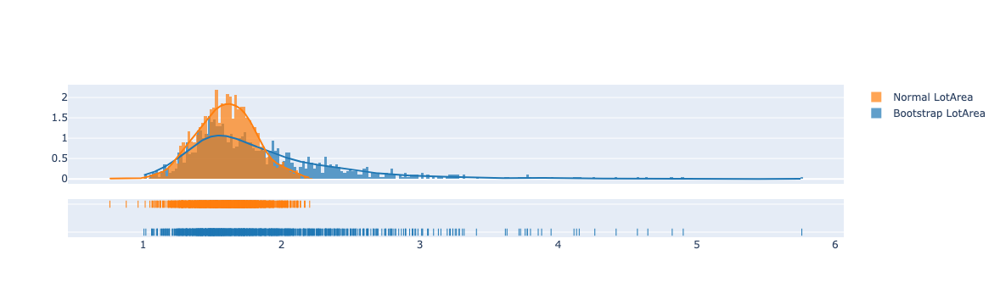

In [856]:
hist_data = [bootstrap_coefs_lotarea, x_lotarea]

group_labels = ["Bootstrap LotArea", "Normal LotArea"]

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.02)
fig.show()

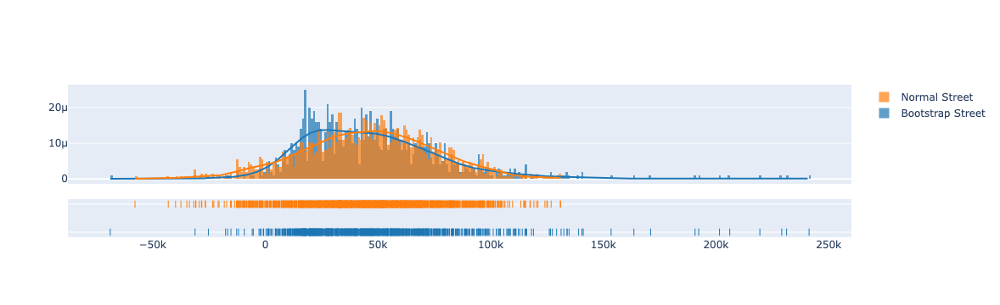

In [862]:
hist_data = [bootstrap_coefs_street, x_street]

group_labels = ["Bootstrap Street", "Normal Street"]

fig = ff.create_distplot(hist_data, group_labels, bin_size=1000)
fig.show()

**Is using boostrap reasonable?**

Yes, it is reasonable. We can quite well boostrap values to match the normal parameter density. The only issues visible are long tails and shifts, which can be signs of some outliers that affect the bootstraping to be biased.

#### i)

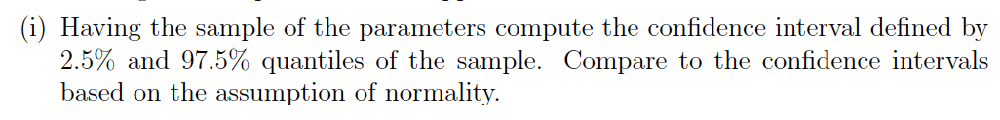

In [864]:
quantiles_lotarea = np.percentile(bootstrap_coefs_lotarea, [2.5, 97.5])
quantiles_street = np.percentile(bootstrap_coefs_street, [2.5, 97.5])

quantiles_normal_lotarea = np.percentile(x_lotarea, [2.5, 97.5])
quantiles_normal_street = np.percentile(x_street, [2.5, 97.5])

# Print confidence intervals
print("LotArea:", quantiles_lotarea)
print("LotArea Normal:", quantiles_normal_lotarea)

print("Street:", quantiles_street)
print("Street Normal:", quantiles_normal_street)

LotArea: [1.17962138 3.28286676]
LotArea Normal: [1.20503359 2.0185214 ]
Street: [  2397.99939344 118120.12393673]
Street Normal: [-11015.2450502  100302.88428859]


**Comparison**

The LotAre CIs are pretty similar except for CI based on boostraping is wider a bit. This could be due to the presence of extreme values or other factors leading to increased variability.

As for Street CIs, they are shifted a bit. This shift can mean presense of a bias or difference between the bootstrap estimates and the normal ones.

#### j) 
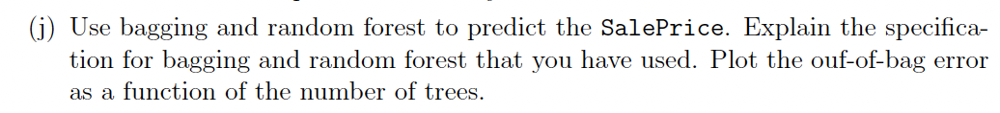

In [578]:
bagging_model = BaggingRegressor(oob_score=True)
random_forest_model = RandomForestRegressor(oob_score=True)

clfs = [("Bagging", bagging_model), ("RandomForest", random_forest_model)]

min_estimators = 15
max_estimators = 150
error_rate = OrderedDict((label, []) for label, _ in clfs)
time_dict = {}

for label, clf in clfs:
    times = []
    for i in range(min_estimators, max_estimators + 1, 5):
        clf.set_params(n_estimators=i)
        start_time = time.time()
        clf.fit(X, y)
        ef_time = time.time() - start_time
        times.append(ef_time)
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))
    time_dict.update({label: times})

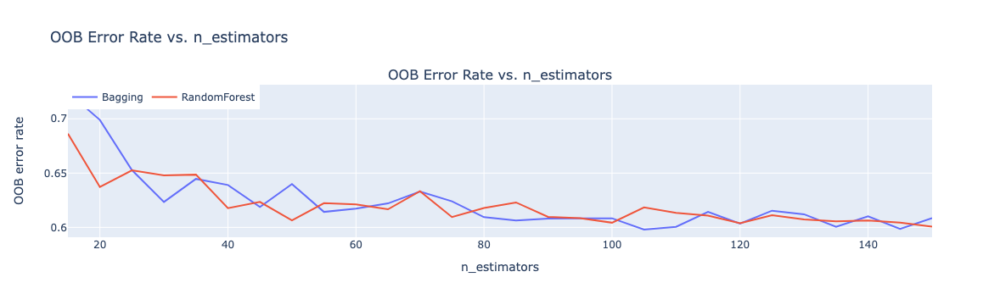

In [579]:
fig = make_subplots(rows=1, cols=1, subplot_titles=["OOB Error Rate vs. n_estimators"])

for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    scatter = go.Scatter(x=xs, y=ys, mode="lines", name=label)
    fig.add_trace(scatter)

fig.update_layout(
    xaxis=dict(title="n_estimators"),
    yaxis=dict(title="OOB error rate"),
    title_text="OOB Error Rate vs. n_estimators",
    legend=dict(x=0, y=1, traceorder="normal", orientation="h"),
)

fig.show()

**Bagging**

In sklearn BaggingRegressor is ensemble estimator that fits multiple base regressor models (Decision Tree is default) on different random subsets of the training data and aggregates their predictions to provide a more robust and generalized model.

General algorithm looks like this:

- Draw N bootstrap samples of some size from the original data
- Train model on each bootstap sample
- Aggregate predictions to produce better output

**RandomForest**

In sklearn RandomForestRegressor is an ensemble estimator that builds a collection of decision trees during training and outputs the average prediction of the individual trees for regression tasks.

It is an extension of the bagging with Decision Tree, but with feature of selecting only subset of variables for each Decision Tree. It produces more heterogenious and independent trees.

#### k)

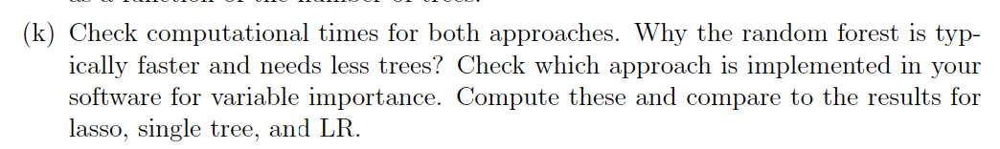

In [581]:
np.array(time_dict["Bagging"]) - np.array(time_dict["RandomForest"])

array([ 0.0130825 ,  0.00576472,  0.01168513,  0.01558018,  0.01138234,
        0.00846124,  0.01021981,  0.01454282,  0.01428604,  0.02330709,
        0.02899265,  0.02678823,  0.03134155,  0.02209616,  0.01990104,
        0.01191592,  0.0177331 ,  0.01694727,  0.01581383,  0.01159883,
       -0.00890207,  0.00034499,  0.02090192,  0.02737522,  0.03910398,
        0.04139185,  0.04027128,  0.03723502])

**Time**

We can see that computational time of Bagging almost always is bigger than the random forest. This is because RandomForest ability to produce more "uncorrelated" trees that results in stronger reduction in the varience and faster convergence to the optimum.

**Variable Importances**

Bagging importances calculation is not implemented, because we can use different estimators.

RandomForest implementation use the impurity-based feature importances. The logic is to shuffle specific features and check the drop in performance. Features with a larger drop in performance after permutation are considered more important because their values contribute significantly to the model's predictive power and vise-versa.

In [590]:
X = df_processed.drop(columns=["SalePrice"])
y = df_processed["SalePrice"]

random_forest_model = RandomForestRegressor()
random_forest_model.fit(X, y)

RandomForestRegressor()

In [592]:
random_forest_importances_df = pd.DataFrame(
    {"Feature": X.columns, "Importance": random_forest_model.feature_importances_}
)
top10_random_forest_importances = random_forest_importances_df.nlargest(
    10, "Importance"
)

print("Top 10 Features and Coefficients (Linear Regression):")
print(top10_linear_coef)

print("\nTop 10 Features and Coefficients (Ridge Regression):")
print(top10_ridge_coef)

print("\nTop 10 Features and Importances (Decision Tree):")
print(top10_tree_importances)

print("\nTop 10 Features and Importances (Random Forest):")
print(top10_random_forest_importances)

Top 10 Features and Coefficients (Linear Regression):
              Feature  Coefficient
137  RoofMatl_CompShg     1.060298
141  RoofMatl_Tar&Grv     0.694041
143  RoofMatl_WdShngl     0.576598
142  RoofMatl_WdShake     0.446012
138  RoofMatl_Membran     0.232060
139    RoofMatl_Metal     0.220352
26          GrLivArea     0.208167
140     RoofMatl_Roll     0.207094
24           2ndFlrSF     0.170103
71        MSZoning_RL     0.143312

Top 10 Features and Coefficients (Ridge Regression):
                  Feature  Coefficient
6             OverallQual     0.110170
26              GrLivArea     0.098640
96   Neighborhood_NoRidge     0.072757
23               1stFlrSF     0.071579
97   Neighborhood_NridgHt     0.069364
143      RoofMatl_WdShngl     0.066314
34           TotRmsAbvGrd     0.063183
39             GarageCars     0.060082
103  Neighborhood_StoneBr     0.057558
24               2ndFlrSF     0.055661

Top 10 Features and Importances (Decision Tree):
        Feature  Importance


**Comparison**

We can see that the tree model's importances are pretty similar. This is quite reasonable, because all models are based on the Decision Trees (in this implementation). The key difference is that Bagging and Random Forest are different combinations of that trees. Because of this we can see that importances are adjusted a bit, but the content is almost the same.

Comparison to the other models is the same as was previously done with single tree.

## Problem 7
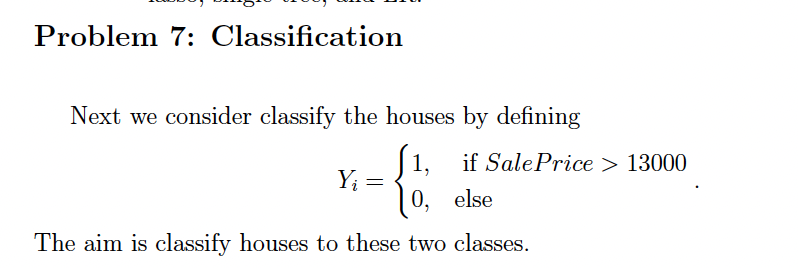

In [828]:
X = df_processed[numerical + ordinal_numerical]
y = pd.Series(np.where(df_processed["SalePrice"] > 130000, 1, 0))

### Task 1

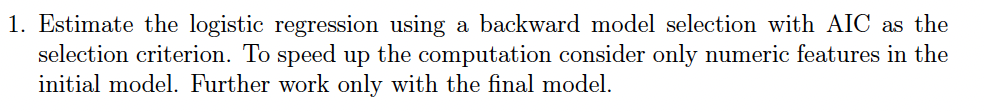

In [737]:
def backward_elimination_aic_logit(X, y, verbose=False):
    aic = float("inf")
    included = list(X.columns)
    while True:
        best_aic = float("inf")
        for feature in included:
            temp_included = list(set(included) - set([feature]))
            model = sm.Logit(y, sm.add_constant(X[temp_included])).fit(
                maxiter=17, full_output=0, warn_convergence=False, disp=False
            )
            current_aic = model.aic
            if current_aic < best_aic:
                best_aic = current_aic
                worst_feature = feature

        if best_aic < aic:
            if verbose:
                print("Drop {:30} with AIC {:.6}".format(worst_feature, best_aic))
            included.remove(worst_feature)
            aic = best_aic
        else:
            if verbose:
                print(
                    "Break {:30} with AIC {:.6} {:.6}".format(
                        worst_feature, best_aic, aic
                    )
                )
            break

    return included, aic

In [738]:
selected_features_backward_logit, aic = backward_elimination_aic_logit(
    X,
    y,
    verbose=True,
)
selected_features_backward_logit

Drop GrLivArea                      with AIC 611.554
Drop BsmtUnfSF                      with AIC 609.554
Drop BsmtFinSF2                     with AIC 607.56
Drop MiscVal                        with AIC 605.567
Drop PoolArea                       with AIC 603.665
Drop GarageCars                     with AIC 601.843
Drop MasVnrArea                     with AIC 600.156
Drop OpenPorchSF                    with AIC 598.492
Drop 3SsnPorch                      with AIC 596.865
Drop LowQualFinSF                   with AIC 595.23
Drop LotFrontage                    with AIC 593.546
Drop YrSold                         with AIC 592.053
Drop BedroomAbvGr                   with AIC 590.731
Drop BsmtHalfBath                   with AIC 589.348
Drop FullBath                       with AIC 588.505
Drop GarageYrBlt                    with AIC 587.828
Drop MoSold                         with AIC 587.688
Drop HalfBath                       with AIC 587.544
Drop EnclosedPorch                  with AIC 587

['YearBuilt',
 'YearRemodAdd',
 'BsmtFinSF1',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GarageArea',
 'WoodDeckSF',
 'ScreenPorch',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'Fireplaces',
 'KitchenAbvGr']

In [755]:
model_logit = sm.Logit(y, sm.add_constant(X[selected_features_backward_logit])).fit()

print(model_logit.summary())

Optimization terminated successfully.
         Current function value: 0.190164
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1460
Model:                          Logit   Df Residuals:                     1444
Method:                           MLE   Df Model:                           15
Date:                Wed, 17 Jan 2024   Pseudo R-squ.:                  0.6666
Time:                        18:40:50   Log-Likelihood:                -277.64
converged:                       True   LL-Null:                       -832.87
Covariance Type:            nonrobust   LLR p-value:                2.733e-227
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const         -153.5888     14.964    -10.264      0.000    -182.918    -124.260
YearBuilt        0.051

### Task 2

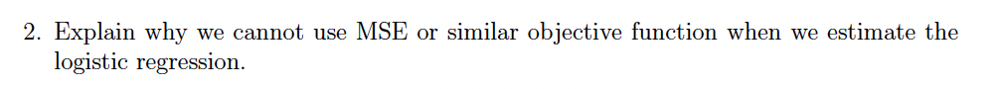

MSE or similar objective functions are unsuitable for logistic regression due to their design for continuous outcomes, while logistic regression predicts probabilities for categorical classes. The logistic regression model uses a sigmoid function, yielding bounded probabilities between 0 and 1, making continious outcome inappropriate. 

Additionally, in classification MSE is not possible because the task is not convex or differentiable. There is not a closed form solution, like in regression. This means that algorithms like gradient descent won’t be able to find an optimal set of weights for the discrete results.

### Task 3
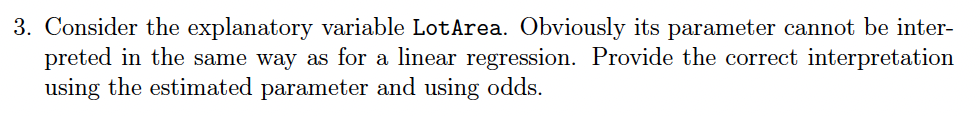

In [902]:
ratio = np.exp(0.0002)

ratio

1.0002000200013335

**Interpretation**

For the logistic regression we have absolutely different parameter interpretation. Here, the odds ratio is used to interpret logistic regression coefficients. The odds represent the likelihood of an event happening compared to it not happening. The ratio is calculated as $e^\beta$, where $\beta$ - parameter of the variable. 

In other words, if the coefficient for LotArea is `0.0002`, then the odds ratio is `1.0002`. This means that for a one-unit increase in LotArea, the odds of the event (success) occurring are expected to increase by approximately 0.02%.

### Task 4

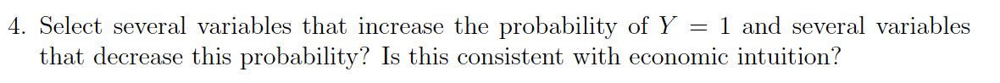

Let's consider KitchenAbvGr (the only negative variable), OverallQual and YearBuilt:

1) KitchenAbvGr - tells how many kitchens above ground. We can interpret the parameter, which is negative and reduces the probability, as the fact that more luxury houses don't have kitchens upstairs. It might be true, as kitchen upstairs is not comfortable and can be a sign of lack of space on the first floor.

2) OverallQual - tells the general quality of the house. The influence is huge and this is actually true. The better grade the highest price.

3) YearBuilt - tells the year house was built. The interpretation approves that older houses are cheaper comparing to the new ones. A quite reasonable statement which approves our assumption we did when looked at the Scatterplots.

### Task 5
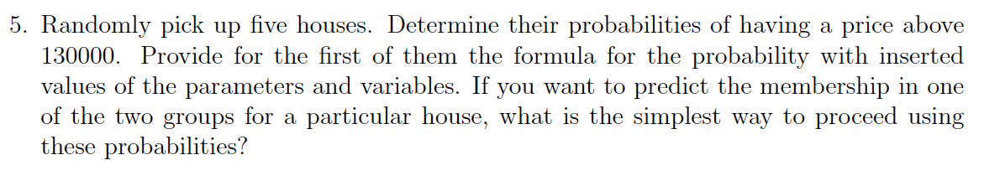

In [763]:
random_houses = df_processed.sample(5)

X_random = random_houses.drop(columns=["SalePrice"])
y_random = pd.Series(np.where(random_houses["SalePrice"] > 130000, 1, 0))

random_houses[selected_features_backward_logit + ["SalePrice"]]

,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GarageArea,WoodDeckSF,ScreenPorch,LotArea,OverallQual,OverallCond,BsmtFullBath,Fireplaces,KitchenAbvGr,SalePrice
1034,1938,1950,0,920,954,0,240,0,0,6305,5,7,0,1,1,119750
573,2000,2000,0,384,774,656,400,100,0,9967,7,5,0,1,1,170000
585,2005,2006,1460,1868,2028,0,880,326,0,11443,8,5,1,2,1,369900
564,1992,2000,728,1095,1166,1129,590,0,0,13346,7,5,1,1,1,268000
1104,1970,1970,0,630,630,672,440,0,0,2016,5,5,0,0,1,106000


In [814]:
model_logit.predict(
    sm.add_constant(X_random[selected_features_backward_logit], has_constant="add")
)

1034    0.058912
573     0.985734
585     1.000000
564     0.999989
1104    0.112678
dtype: float64

**Formula**

$P(Y = 1) = \frac{1}{1 + e^{-z_i}}$, where $z_i = \beta_0 + \beta_1X_{1i} + ... + \beta_kX_{ki}$

$P(Y = 1) = \frac{1}{1 + e^{2.77099}}$, $z_i = -153.58 + 0.05 * 1938 + 0.01 * 1950 + 0.0012 * 0 + ... + -1.7523 * 1 $

$P(Y = 1) = 0.0589$

**Prediction**

After obtaining the probabilities for each house, the simplest way to predict the membership in one of the two groups (above 130,000 or not) is to use a threshold. For example, if the probability is greater than 0.5, we might classify it as belonging to the group with prices above 130,000. Otherwise, it belongs to the other group. We can adjust the threshold based on the desired balance between sensitivity and specificity in the classification task.

In [823]:
# calculate z_i
log_odds = np.dot(
    model_logit.params.values, [1, *X_random[selected_features_backward_logit].iloc[0]]
)
# calculate prediction
predicted_probability = 1 / (1 + np.exp(-log_odds))
log_odds, predicted_probability

(-2.770993872545958, 0.05891188773967391)

### Task 6

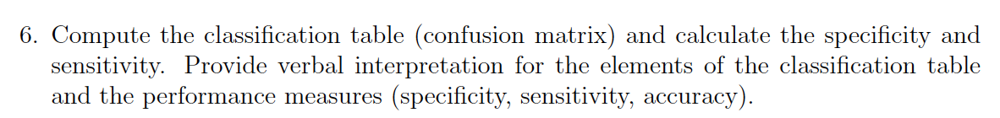

In [876]:
threshold = 0.5
predicted_probabilities = model_logit.predict(
    sm.add_constant(X[selected_features_backward_logit], has_constant="add")
)
predicted_classes = (predicted_probabilities >= threshold).astype(int)

conf_matrix = confusion_matrix(y, predicted_classes)
TN, FP, FN, TP = conf_matrix.ravel()

specificity = TN / (TN + FP)
sensitivity = recall_score(y, predicted_classes)
accuracy = accuracy_score(y, predicted_classes)

print("Specificity:", specificity)
print("Sensitivity:", sensitivity)
print("Accuracy:", accuracy)

conf_matrix

Specificity: 0.8430851063829787
Sensitivity: 0.955719557195572
Accuracy: 0.9267123287671233


array([[ 317,   59],
       [  48, 1036]])

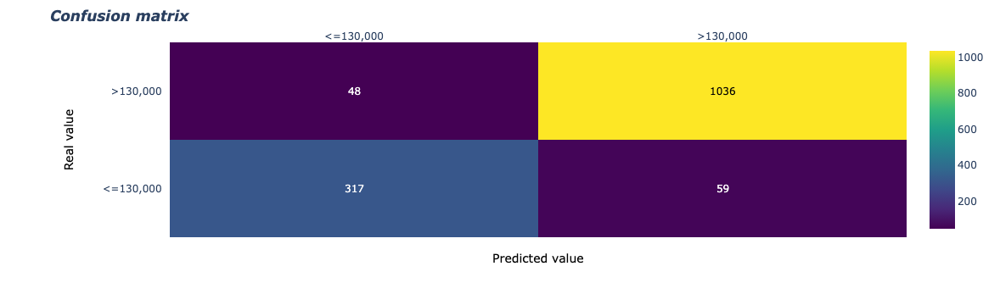

In [869]:
class_labels = ["<=130,000", ">130,000"]
z_text = [[str(y) for y in x] for x in conf_matrix]
fig = ff.create_annotated_heatmap(
    conf_matrix,
    x=class_labels,
    y=class_labels,
    annotation_text=z_text,
    colorscale="Viridis",
)
fig.update_layout(title_text="<i><b>Confusion matrix</b></i>")
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=0.5,
        y=-0.15,
        showarrow=False,
        text="Predicted value",
        xref="paper",
        yref="paper",
    )
)
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=-0.15,
        y=0.5,
        showarrow=False,
        text="Real value",
        textangle=-90,
        xref="paper",
        yref="paper",
    )
)
fig.update_layout(margin=dict(t=50, l=200))
fig["data"][0]["showscale"] = True
fig.show()

**Interpretation**

1) Matrix

Confusion matrix is the matrix where each cell represents the number of predictions that falls under specific conditions. In our case, rows of the matrix represents the real SalePrice classes of every sample and columns the predicted class by our model. Having the real SalePrice class and predicted one, we can count number of samples in each cell.

Cells have names:

TP - number of correctly predicted Y=1 samples = 1036

TN - number of correctly predicted T=0 samples = 317

FN - number of falsy predicted Y=1 samples = 48

FP - number of falsy predicted Y=0 samples = 59

2) Specifity (Recall)

The fraction of correctly classified Y=0 among all Y=0 samples. In simple words, tells us how many <=130.000 houses we predicted of all such houses.

Sensitivity = TN / (TN + FP) = 317 / (317 + 59) = 0.843

3) Sensitivity (Precision)

The fraction of correctly classified Y=1 among all Y=1 samples. In simple words, tells us how many >130.000 houses we predicted of all such houses.

Specifity = TP / (TP + FN) = 1036 / (1036 + 48) = 0.955


The Specifity and Sensitivity are two sides of the same coin and they should be in the balance, which highly depends on the model requirements.

4) Accuracy

Last, but not least, accuracy is the fraction of correct decision among all predictions. We simply look whether our model predictions all correct. This metric is very tricky and can be very high when the data is unbalanced (almost always). For example, in our case we have 3 times smaller number of <=130.000 than other class, so if model classify all as >130.000 we get ~66% accuracy with the model that can't do anything.

Accuracy = (TP + TN) / (TP + TN + FP + FN) = (1036 + 317) / (1036 + 317 + 59 + 48) = 0.926

### Task 7

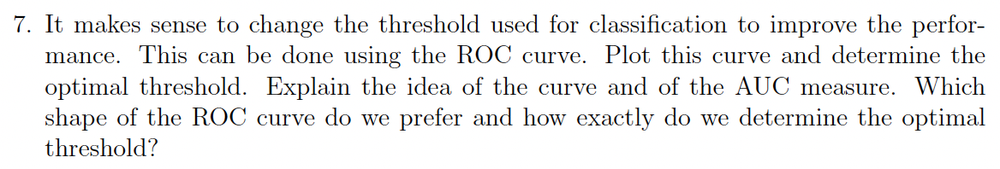

In [872]:
fpr, tpr, thresholds = roc_curve(y, predicted_probabilities)
roc_auc = auc(fpr, tpr)

roc_auc

0.9705201872497448

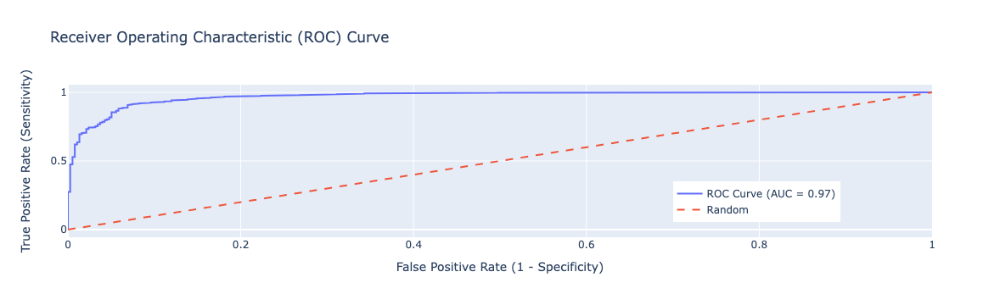

In [873]:
roc_trace = go.Scatter(
    x=fpr, y=tpr, mode="lines", name=f"ROC Curve (AUC = {roc_auc:.2f})"
)
random_trace = go.Scatter(
    x=[0, 1], y=[0, 1], mode="lines", line=dict(dash="dash"), name="Random"
)
layout = go.Layout(
    title="Receiver Operating Characteristic (ROC) Curve",
    xaxis=dict(title="False Positive Rate (1 - Specificity)"),
    yaxis=dict(title="True Positive Rate (Sensitivity)"),
    legend=dict(x=0.7, y=0.1),
)
fig = go.Figure(data=[roc_trace, random_trace], layout=layout)
fig.show()

In [874]:
optimal_threshold_index = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_threshold_index]

print("Optimal Threshold:", optimal_threshold)

Optimal Threshold: 0.7140084841213983


**Idea**

ROC Curve is the representation of sensitivity values as a function of specifity. It plots TPR vs FPR at different classification thresholds. If the curve is close to the diagonal then the classifier is not far from a random assigment.

It is clear that to compute points in an ROC curve, we could evaluate a logistic regression model many times with different classification thresholds, but this would be inefficient.

Here we use AUC (Area Under Curve). AUC provides an aggregate measure of performance across all possible classification thresholds. AUC can be interpreated as the probability that the model ranks a random positive example more highly than a random negative example. In simple words, probability whether positive samples are ranked higher than the negative ones. For the ideal model AUC should be 1 and vise-versa for the bad.

**Shape and Optimal**

The steepest ROC function the better for us. It simply means that even with small threshold the probability of ranking model well is high.

To find the most optimal threshold we should find index of the threshold where the difference between true positive rate and false positive rate is the largest. The explanation is simple, we just look for the threshold where the largest sum of Sensitivity and Specificity. We can weight each of the parameter according to our needs, but to keep balance we just look at the difference.

### Task 8

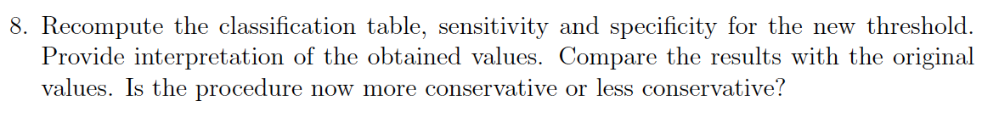

In [877]:
predicted_classes_optimal = (predicted_probabilities >= optimal_threshold).astype(int)

conf_matrix_optimal = confusion_matrix(y, predicted_classes_optimal)

TN_o, FP_o, FN_o, TP_o = conf_matrix_optimal.ravel()
specificity_o = TN_o / (TN_o + FP_o)
sensitivity_o = recall_score(y, predicted_classes_optimal)
accuracy_o = accuracy_score(y, predicted_classes_optimal)

print("Specificity:", specificity_o)
print("Sensitivity:", sensitivity_o)
print("Accuracy:", accuracy_o)

conf_matrix_optimal

Specificity: 0.925531914893617
Sensitivity: 0.9142066420664207
Accuracy: 0.9171232876712329


array([[348,  28],
       [ 93, 991]])

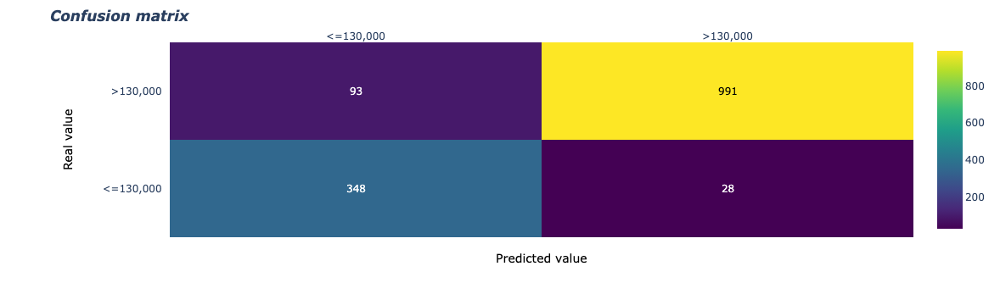

In [879]:
class_labels = ["<=130,000", ">130,000"]
z_text = [[str(y) for y in x] for x in conf_matrix_optimal]
fig = ff.create_annotated_heatmap(
    conf_matrix_optimal,
    x=class_labels,
    y=class_labels,
    annotation_text=z_text,
    colorscale="Viridis",
)
fig.update_layout(title_text="<i><b>Confusion matrix</b></i>")
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=0.5,
        y=-0.15,
        showarrow=False,
        text="Predicted value",
        xref="paper",
        yref="paper",
    )
)
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=-0.15,
        y=0.5,
        showarrow=False,
        text="Real value",
        textangle=-90,
        xref="paper",
        yref="paper",
    )
)
fig.update_layout(margin=dict(t=50, l=200))
fig["data"][0]["showscale"] = True
fig.show()

**Conclusions**

If we compare two results, we will see that selecting optimal threshold make metrics balanced as we wanted when looked for the threshold. However, the number of missclassifications becomes slighly bigger. The model become more concervative (strict to making positive decision) as the number of FN increases and number of FP decreases.

### Task 9

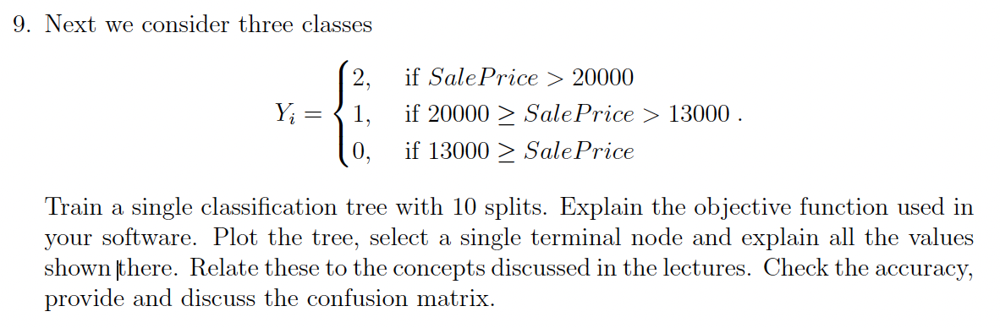

In [887]:
bins = [float("-inf"), 130000, 200000, float("inf")]
labels = [0, 1, 2]

X = df_processed[numerical + ordinal_numerical]
y = pd.cut(df_processed["SalePrice"], bins=bins, labels=labels, include_lowest=True)

In [890]:
classifier_tree = DecisionTreeClassifier(max_leaf_nodes=10 + 1)
classifier_tree.fit(X, y)

DecisionTreeClassifier(max_leaf_nodes=11)

**Objective function**

This implementation uses Gini impurity by default. 

$Gini(S) = 1 - \sum_{i=1}^Cp_i^2$, where C - is number of classes, $p_i$ is the probability of picking a datapoint with class i

This metric simply defines the likelihood of misclassifying a sample in the node.

The objective is to find splits in the data that minimize the weighted sum of Gini impurities for the resulting child nodes. 

Generally, the algorithm computes the Gini impurity for the resulting left and right child nodes (of some possible split), and the weighted sum of these impurities is used as a measure of how well the split separates the data. The split that minimizes the weighted sum of Gini impurities is chosen as the optimal split.

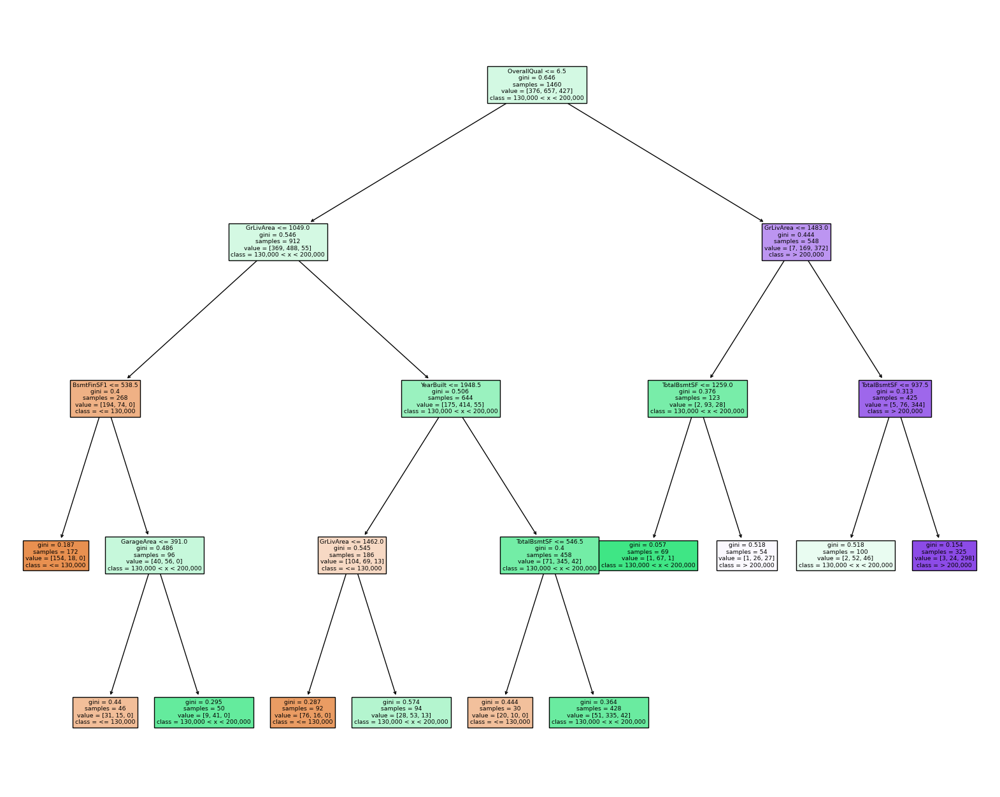

In [892]:
plt.figure(figsize=(20, 16))
plot_tree(
    classifier_tree,
    filled=True,
    feature_names=X.columns,
    class_names=["<= 130,000", "130,000 < x < 200,000", "> 200,000"],
)
plt.show()

**Tree explaining**

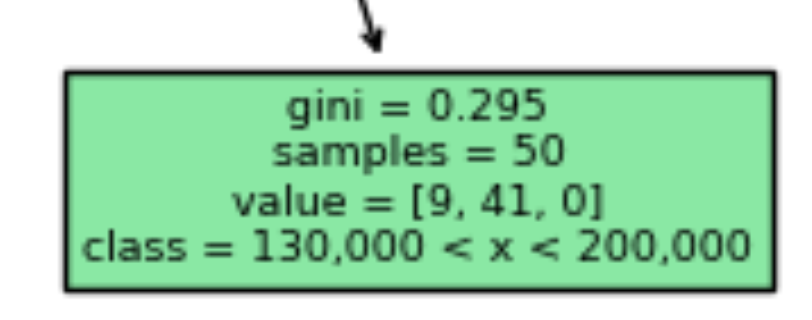

1) title - (in parent node) split rule of the node

2) gini - the Gini impurity metric of the node

3) samples - the total number of samples that reached this node during the building process

4) value - information about the distribution of classes in the node. Absolute values

5) class - the class with the highest count in the node and final predicted class

In [896]:
classifier_tree_predictions = classifier_tree.predict(X)

accuracy = accuracy_score(y, classifier_tree_predictions)
classifier_tree_conf_matrix = confusion_matrix(y, classifier_tree_predictions)

print("Accuracy:", accuracy)
classifier_tree_conf_matrix

Accuracy: 0.7904109589041096


array([[281,  91,   4],
       [ 59, 548,  50],
       [  0, 102, 325]])

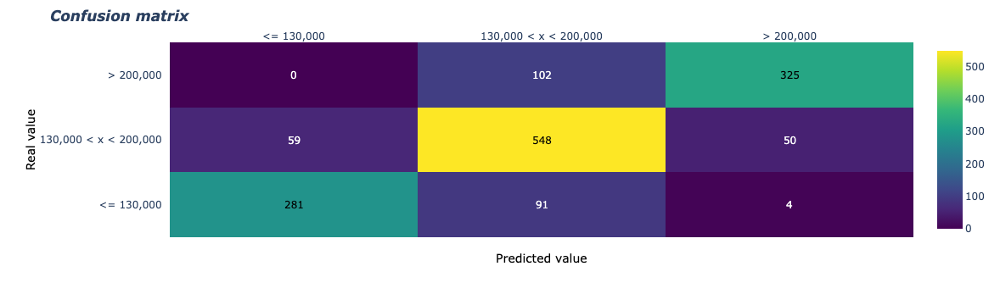

In [901]:
class_labels = ["<= 130,000", "130,000 < x < 200,000", "> 200,000"]
z_text = [[str(y) for y in x] for x in classifier_tree_conf_matrix]
fig = ff.create_annotated_heatmap(
    classifier_tree_conf_matrix,
    x=class_labels,
    y=class_labels,
    annotation_text=z_text,
    colorscale="Viridis",
)
fig.update_layout(title_text="<i><b>Confusion matrix</b></i>")
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=0.5,
        y=-0.15,
        showarrow=False,
        text="Predicted value",
        xref="paper",
        yref="paper",
    )
)
fig.add_annotation(
    dict(
        font=dict(color="black", size=14),
        x=-0.2,
        y=0.5,
        showarrow=False,
        text="Real value",
        textangle=-90,
        xref="paper",
        yref="paper",
    )
)
fig.update_layout(margin=dict(t=50, l=200))
fig["data"][0]["showscale"] = True
fig.show()

**Confusion matrix**

Accuracy of the model is about ~80%, which is quite well (4/5 of our houses are correctly classified). However, by looking at the confusion matrix we can see that we have lots of mistakes (x2 comparing to other errors) in middle class prediction. So, the model has difficulties with distinguishing middle class among others. On the other hand, edge classes are splitted very well, only several errors. 

In general, we should work on making easier for model to predict the middle class vs edge as almost all errors are connected with it.